In [151]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [152]:
import re

In [153]:
pwd

'C:\\Users\\priya'

In [4]:
data=pd.read_excel(r"C:\Users\priya\Downloads\resturant.xlsx" )  

In [5]:
data

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51712,https://www.zomato.com/bangalore/best-brews-fo...,"Four Points by Sheraton Bengaluru, 43/3, White...",Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6 /5,27,080 40301477,Whitefield,Bar,NaN,Continental,1500.0,"[('Rated 5.0', ""RATED\n Food and service are ...",[],Pubs and bars,Whitefield
51713,https://www.zomato.com/bangalore/vinod-bar-and...,"Number 10, Garudachar Palya, Mahadevapura, Whi...",Vinod Bar And Restaurant,No,No,NaN,0,+91 8197675843,Whitefield,Bar,NaN,Finger Food,600.0,[],[],Pubs and bars,Whitefield
51714,https://www.zomato.com/bangalore/plunge-sherat...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,NaN,0,NaN,Whitefield,Bar,NaN,Finger Food,2000.0,[],[],Pubs and bars,Whitefield
51715,https://www.zomato.com/bangalore/chime-sherato...,Sheraton Grand Bengaluru Whitefield Hotel & Co...,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3 /5,236,080 49652769,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,"[('Rated 4.0', 'RATED\n Nice and friendly pla...",[],Pubs and bars,Whitefield


In [6]:
data.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [7]:
data.columns

Index(['url', 'address', 'name', 'online_order', 'book_table', 'rate', 'votes',
       'phone', 'location', 'rest_type', 'dish_liked', 'cuisines',
       'approx_cost(for two people)', 'reviews_list', 'menu_item',
       'listed_in(type)', 'listed_in(city)'],
      dtype='object')

In [8]:
data.drop(['url','address','phone','reviews_list','menu_item','listed_in(city)'],inplace=True,axis=1)

In [9]:
len(data.columns)

11

In [154]:
data.duplicated().sum()

16608

In [155]:
after_dropping_duplicate = data.drop_duplicates() 

In [12]:
after_dropping_duplicate

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
0,Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet
1,Spice Elephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet
2,San Churro Cafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet
3,Addhuri Udupi Bhojana,No,No,3.7/5,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet
4,Grand Village,No,No,3.8/5,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet
...,...,...,...,...,...,...,...,...,...,...,...
51712,Best Brews - Four Points by Sheraton Bengaluru...,No,No,3.6 /5,27,Whitefield,Bar,NaN,Continental,1500.0,Pubs and bars
51713,Vinod Bar And Restaurant,No,No,NaN,0,Whitefield,Bar,NaN,Finger Food,600.0,Pubs and bars
51714,Plunge - Sheraton Grand Bengaluru Whitefield H...,No,No,NaN,0,Whitefield,Bar,NaN,Finger Food,2000.0,Pubs and bars
51715,Chime - Sheraton Grand Bengaluru Whitefield Ho...,No,Yes,4.3 /5,236,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,Pubs and bars


In [13]:
after_dropping_duplicate.info() 

<class 'pandas.core.frame.DataFrame'>
Index: 35109 entries, 0 to 51716
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   name                         35109 non-null  object 
 1   online_order                 35109 non-null  object 
 2   book_table                   35109 non-null  object 
 3   rate                         31339 non-null  object 
 4   votes                        35109 non-null  int64  
 5   location                     35095 non-null  object 
 6   rest_type                    34953 non-null  object 
 7   dish_liked                   18102 non-null  object 
 8   cuisines                     35076 non-null  object 
 9   approx_cost(for two people)  34888 non-null  float64
 10  listed_in(type)              35109 non-null  object 
dtypes: float64(1), int64(1), object(9)
memory usage: 3.2+ MB


In [14]:
after_dropping_duplicate['name'][:20] 

0                                                 Jalsa
1                                        Spice Elephant
2                                       San Churro Cafe
3                                 Addhuri Udupi Bhojana
4                                         Grand Village
5                                       Timepass Dinner
6       Rosewood International Hotel - Bar & Restaurant
7                                                Onesta
8                                        Penthouse Cafe
9                                             Smacznego
10    CafÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ© Down The A...
11                                         Cafe Shuffle
12                                     The Coffee Shack
13                                           Caf-Eleven
14                                      San Churro Cafe
15                                        Cafe Vivacity
16                                         Catch-up-ino
17                                     Kirthi's 

In [15]:
after_dropping_duplicate['name'].iloc[10]

'CafÃ\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â© Down The Alley'

In [16]:
after_dropping_duplicate['name'].iloc[1750:1800] 

1751                                               Arzak
1752                            Furry Fairy Paw Paradise
1753                                               Petoo
1754                                         Night Panda
1755                                         Spicy Grill
1756    E2 - EntrÃÂÃÂÃÂÃÂÃÂÃÂÃÂÃÂ©e Envoy
1757                                       Aha Juice Bar
1758                         Cafe Club Kerala Restaurant
1759                                      Cake N Cookies
1760                                      Bright Go Nuts
1761                                     Hotel Namadhari
1762                                  Nammuru Nati Hotel
1763                                          3ice Cubes
1764                                    Tasty Restaurant
1765                                        Hotel Ambara
1766                                       Biryani Treat
1767                                        Best Biryani
1768                           

In [156]:
isinstance('12',int)

False

In [18]:
def clean_rest_name(name):
    if isinstance(name,str):
        if re.findall(r'[a-zA-Z0-9]',name):
            list_name = re.findall(r'[a-zA-z0-9]',name)
            string_name="".join(list_name)
            return string_name
        else:
                return name

In [19]:
after_dropping_duplicate['name']= after_dropping_duplicate['name'].apply(clean_rest_name) 

C:\Users\priya\AppData\Local\Temp\ipykernel_25092\1834305514.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicate['name']= after_dropping_duplicate['name'].apply(clean_rest_name)


In [20]:
after_dropping_duplicate['name'][1750:1800] 

1751                       Arzak
1752       FurryFairyPawParadise
1753                       Petoo
1754                  NightPanda
1755                  SpicyGrill
1756                E2EntreEnvoy
1757                 AhaJuiceBar
1758    CafeClubKeralaRestaurant
1759                CakeNCookies
1760                BrightGoNuts
1761              HotelNamadhari
1762            NammuruNatiHotel
1763                   3iceCubes
1764             TastyRestaurant
1765                 HotelAmbara
1766                BiryaniTreat
1767                 BestBiryani
1768                      Innate
1769                TandooriSpot
1770                 NightHunger
1771        SanthrupthiHalliMane
1772              IyengarsBakery
1773                    NutriFit
1774               NewKababPlaza
1775              PadosiApkeApne
1776               GrillOnWheels
1777               CharcoalFlame
1778                 ChickenDera
1779                  CocoanCrme
1780         SpicyzoneRestaurant
1781      

In [21]:
after_dropping_duplicate.head()  

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
0,Jalsa,Yes,Yes,4.1/5,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet
1,SpiceElephant,Yes,No,4.1/5,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet
2,SanChurroCafe,Yes,No,3.8/5,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet
3,AddhuriUdupiBhojana,No,No,3.7/5,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet
4,GrandVillage,No,No,3.8/5,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet


In [22]:
after_dropping_duplicate['online_order'].value_counts()  #around 20k resturants in Banglore provides the online order service

online_order
Yes    20886
No     14223
Name: count, dtype: int64

In [23]:
after_dropping_duplicate['book_table'].value_counts() # Around 29k resturants in Banglore allows booking of table 

book_table
No     29675
Yes     5434
Name: count, dtype: int64

In [24]:
after_dropping_duplicate['rate'] 

0         4.1/5
1         4.1/5
2         3.8/5
3         3.7/5
4         3.8/5
          ...  
51712    3.6 /5
51713       NaN
51714       NaN
51715    4.3 /5
51716    3.4 /5
Name: rate, Length: 35109, dtype: object

In [25]:
after_dropping_duplicate['rate'].unique()

array(['4.1/5', '3.8/5', '3.7/5', '3.6/5', '4.6/5', '4.0/5', '4.2/5',
       '3.9/5', '3.1/5', '3.0/5', '3.2/5', '3.3/5', '2.8/5', '4.4/5',
       '4.3/5', 'NEW', '2.9/5', '3.5/5', nan, '2.6/5', '3.8 /5', '3.4/5',
       '4.5/5', '2.5/5', '2.7/5', '4.7/5', '2.4/5', '2.2/5', '2.3/5',
       '3.4 /5', '-', '3.6 /5', '4.8/5', '3.9 /5', '4.2 /5', '4.0 /5',
       '4.1 /5', '3.7 /5', '3.1 /5', '2.9 /5', '3.3 /5', '2.8 /5',
       '3.5 /5', '2.7 /5', '2.5 /5', '3.2 /5', '2.6 /5', '4.5 /5',
       '4.3 /5', '4.4 /5', '4.9/5', '2.1/5', '2.0/5', '1.8/5', '4.6 /5',
       '4.9 /5', '3.0 /5', '4.8 /5', '2.3 /5', '4.7 /5', '2.4 /5',
       '2.1 /5', '2.2 /5', '2.0 /5', '1.8 /5'], dtype=object)

In [26]:
float('4.1/5'.split('/')[0])

4.1

In [27]:
def clean_rate(rates):
    if rates == "-" or rates == "NEW":
        return np.nan
    else:
        rates_converted = float(str(rates).split('/')[0])
        return rates_converted 

In [28]:
after_dropping_duplicate['rate']=after_dropping_duplicate['rate'].apply(clean_rate) 

C:\Users\priya\AppData\Local\Temp\ipykernel_25092\3970545193.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicate['rate']=after_dropping_duplicate['rate'].apply(clean_rate)


In [29]:
after_dropping_duplicate['rate'] 

0        4.1
1        4.1
2        3.8
3        3.7
4        3.8
        ... 
51712    3.6
51713    NaN
51714    NaN
51715    4.3
51716    3.4
Name: rate, Length: 35109, dtype: float64

In [30]:
after_dropping_duplicate # The rates are out of 5 

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet
1,SpiceElephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet
2,SanChurroCafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet
3,AddhuriUdupiBhojana,No,No,3.7,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet
4,GrandVillage,No,No,3.8,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet
...,...,...,...,...,...,...,...,...,...,...,...
51712,BestBrewsFourPointsbySheratonBengaluru,No,No,3.6,27,Whitefield,Bar,NaN,Continental,1500.0,Pubs and bars
51713,VinodBarAndRestaurant,No,No,NaN,0,Whitefield,Bar,NaN,Finger Food,600.0,Pubs and bars
51714,PlungeSheratonGrandBengaluruWhitefieldHotel,No,No,NaN,0,Whitefield,Bar,NaN,Finger Food,2000.0,Pubs and bars
51715,ChimeSheratonGrandBengaluruWhitefieldHotel,No,Yes,4.3,236,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,Pubs and bars


In [31]:
after_dropping_duplicate['rate'].mean()

3.731078872769718

In [32]:
after_dropping_duplicate['rate'].fillna(after_dropping_duplicate['rate'].mean(),inplace=True) # we are filling NA values with the mean 

C:\Users\priya\AppData\Local\Temp\ipykernel_25092\2802115798.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicate['rate'].fillna(after_dropping_duplicate['rate'].mean(),inplace=True) # we are filling NA values with the mean


In [33]:
after_dropping_duplicate # All the null values of rates have been filled with the mean of the rates

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
0,Jalsa,Yes,Yes,4.100000,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet
1,SpiceElephant,Yes,No,4.100000,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet
2,SanChurroCafe,Yes,No,3.800000,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet
3,AddhuriUdupiBhojana,No,No,3.700000,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet
4,GrandVillage,No,No,3.800000,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet
...,...,...,...,...,...,...,...,...,...,...,...
51712,BestBrewsFourPointsbySheratonBengaluru,No,No,3.600000,27,Whitefield,Bar,NaN,Continental,1500.0,Pubs and bars
51713,VinodBarAndRestaurant,No,No,3.731079,0,Whitefield,Bar,NaN,Finger Food,600.0,Pubs and bars
51714,PlungeSheratonGrandBengaluruWhitefieldHotel,No,No,3.731079,0,Whitefield,Bar,NaN,Finger Food,2000.0,Pubs and bars
51715,ChimeSheratonGrandBengaluruWhitefieldHotel,No,Yes,4.300000,236,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,Pubs and bars


In [34]:
after_dropping_duplicate['rate'] = round(after_dropping_duplicate['rate'],1) # we are rounding off the rate value to one decimal place

C:\Users\priya\AppData\Local\Temp\ipykernel_25092\406769220.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicate['rate'] = round(after_dropping_duplicate['rate'],1) # we are rounding off the rate value to one decimal place


In [35]:
after_dropping_duplicate

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
0,Jalsa,Yes,Yes,4.1,775,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800.0,Buffet
1,SpiceElephant,Yes,No,4.1,787,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800.0,Buffet
2,SanChurroCafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.0,Buffet
3,AddhuriUdupiBhojana,No,No,3.7,88,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300.0,Buffet
4,GrandVillage,No,No,3.8,166,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600.0,Buffet
...,...,...,...,...,...,...,...,...,...,...,...
51712,BestBrewsFourPointsbySheratonBengaluru,No,No,3.6,27,Whitefield,Bar,NaN,Continental,1500.0,Pubs and bars
51713,VinodBarAndRestaurant,No,No,3.7,0,Whitefield,Bar,NaN,Finger Food,600.0,Pubs and bars
51714,PlungeSheratonGrandBengaluruWhitefieldHotel,No,No,3.7,0,Whitefield,Bar,NaN,Finger Food,2000.0,Pubs and bars
51715,ChimeSheratonGrandBengaluruWhitefieldHotel,No,Yes,4.3,236,"ITPL Main Road, Whitefield",Bar,"Cocktails, Pizza, Buttermilk",Finger Food,2500.0,Pubs and bars


In [36]:
after_dropping_duplicate['votes'].value_counts()

votes
0       5099
4        764
6        632
7        551
9        469
        ... 
2569       1
575        1
7227       1
1290       1
843        1
Name: count, Length: 2328, dtype: int64

In [37]:
after_dropping_duplicate.info() #now we can see that the rate and the votes have no null values 

<class 'pandas.core.frame.DataFrame'>
Index: 35109 entries, 0 to 51716
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   name                         35095 non-null  object 
 1   online_order                 35109 non-null  object 
 2   book_table                   35109 non-null  object 
 3   rate                         35109 non-null  float64
 4   votes                        35109 non-null  int64  
 5   location                     35095 non-null  object 
 6   rest_type                    34953 non-null  object 
 7   dish_liked                   18102 non-null  object 
 8   cuisines                     35076 non-null  object 
 9   approx_cost(for two people)  34888 non-null  float64
 10  listed_in(type)              35109 non-null  object 
dtypes: float64(2), int64(1), object(8)
memory usage: 3.2+ MB


In [38]:
pd.set_option('display.max_rows',None)

In [39]:
after_dropping_duplicate['location'].value_counts()

location
BTM                              2520
Whitefield                       1972
Indiranagar                      1792
HSR                              1774
Marathahalli                     1683
Koramangala 5th Block            1623
JP Nagar                         1426
Jayanagar                        1253
Electronic City                  1222
Bellandur                        1138
Bannerghatta Road                1064
Sarjapur Road                     950
Brigade Road                      690
Koramangala 7th Block             628
Koramangala 6th Block             607
Brookefield                       600
Kalyan Nagar                      595
Koramangala 4th Block             589
New BEL Road                      586
Banashankari                      574
MG Road                           573
Malleshwaram                      557
Ulsoor                            552
Koramangala 1st Block             542
Frazer Town                       476
Basavanagudi                      463
Raj

In [40]:
after_dropping_duplicate['location'].unique()

array(['Banashankari', 'Basavanagudi', 'Mysore Road', 'Jayanagar',
       'Kumaraswamy Layout', 'Rajarajeshwari Nagar', 'Vijay Nagar',
       'Uttarahalli', 'JP Nagar', 'South Bangalore', 'City Market',
       'Nagarbhavi', 'Bannerghatta Road', 'BTM', 'Kanakapura Road',
       'Bommanahalli', nan, 'CV Raman Nagar', 'Electronic City', 'HSR',
       'Marathahalli', 'Sarjapur Road', 'Wilson Garden', 'Shanti Nagar',
       'Koramangala 5th Block', 'Koramangala 8th Block', 'Richmond Road',
       'Koramangala 7th Block', 'Jalahalli', 'Koramangala 4th Block',
       'Bellandur', 'Whitefield', 'East Bangalore', 'Old Airport Road',
       'Indiranagar', 'Koramangala 1st Block', 'Frazer Town', 'RT Nagar',
       'MG Road', 'Brigade Road', 'Lavelle Road', 'Church Street',
       'Ulsoor', 'Residency Road', 'Shivajinagar', 'Infantry Road',
       'St. Marks Road', 'Cunningham Road', 'Race Course Road',
       'Commercial Street', 'Vasanth Nagar', 'HBR Layout', 'Domlur',
       'Ejipura', 'Jeevan 

In [41]:
after_dropping_duplicate['location'].fillna("No Info",inplace=True) # filling the null values of location with 'no info'

C:\Users\priya\AppData\Local\Temp\ipykernel_25092\3652553413.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicate['location'].fillna("No Info",inplace=True) # filling the null values of location with 'no info'


In [42]:
after_dropping_duplicate['location'].unique()

array(['Banashankari', 'Basavanagudi', 'Mysore Road', 'Jayanagar',
       'Kumaraswamy Layout', 'Rajarajeshwari Nagar', 'Vijay Nagar',
       'Uttarahalli', 'JP Nagar', 'South Bangalore', 'City Market',
       'Nagarbhavi', 'Bannerghatta Road', 'BTM', 'Kanakapura Road',
       'Bommanahalli', 'No Info', 'CV Raman Nagar', 'Electronic City',
       'HSR', 'Marathahalli', 'Sarjapur Road', 'Wilson Garden',
       'Shanti Nagar', 'Koramangala 5th Block', 'Koramangala 8th Block',
       'Richmond Road', 'Koramangala 7th Block', 'Jalahalli',
       'Koramangala 4th Block', 'Bellandur', 'Whitefield',
       'East Bangalore', 'Old Airport Road', 'Indiranagar',
       'Koramangala 1st Block', 'Frazer Town', 'RT Nagar', 'MG Road',
       'Brigade Road', 'Lavelle Road', 'Church Street', 'Ulsoor',
       'Residency Road', 'Shivajinagar', 'Infantry Road',
       'St. Marks Road', 'Cunningham Road', 'Race Course Road',
       'Commercial Street', 'Vasanth Nagar', 'HBR Layout', 'Domlur',
       'Ejipu

In [43]:
after_dropping_duplicate['rest_type'].fillna("No Info",inplace=True) #filling the nullvalues of resturant type with 'no info'

C:\Users\priya\AppData\Local\Temp\ipykernel_25092\1038209471.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicate['rest_type'].fillna("No Info",inplace=True) #filling the nullvalues of resturant type with 'no info'


In [44]:
after_dropping_duplicate['dish_liked'].unique()

array(['Pasta, Lunch Buffet, Masala Papad, Paneer Lajawab, Tomato Shorba, Dum Biryani, Sweet Corn Soup',
       'Momos, Lunch Buffet, Chocolate Nirvana, Thai Green Curry, Paneer Tikka, Dum Biryani, Chicken Biryani',
       'Churros, Cannelloni, Minestrone Soup, Hot Chocolate, Pink Sauce Pasta, Salsa, Veg Supreme Pizza',
       ...,
       'Noodles, Chicken Noodle, Momos, American Chopsuey, Salad, Manchow Soup, Manchurian',
       'Chicken Quesadilla, Naan, Breakfast Buffet, Cheesecake, Cocktails, Lunch Buffet, Biryani',
       'Biryani, Andhra Meal'], dtype=object)

In [45]:
for item in after_dropping_duplicate['dish_liked'].unique():
    print(item)

Pasta, Lunch Buffet, Masala Papad, Paneer Lajawab, Tomato Shorba, Dum Biryani, Sweet Corn Soup
Momos, Lunch Buffet, Chocolate Nirvana, Thai Green Curry, Paneer Tikka, Dum Biryani, Chicken Biryani
Churros, Cannelloni, Minestrone Soup, Hot Chocolate, Pink Sauce Pasta, Salsa, Veg Supreme Pizza
Masala Dosa
Panipuri, Gol Gappe
Onion Rings, Pasta, Kadhai Paneer, Salads, Salad, Roti, Jeera Rice
nan
Farmhouse Pizza, Chocolate Banana, Virgin Mojito, Pasta, Paneer Tikka, Lime Soda, Prawn Pizza
Pizza, Mocktails, Coffee, Nachos, Salad, Pasta, Sandwiches
Waffles, Pasta, Coleslaw Sandwich, Choco Waffle, Tacos, Momos, Cheese Nachos
Waffles, Pasta, Crispy Chicken, Honey Chilli Chicken, Sandwich, Coffee, Crepe
Mocktails, Peri Fries, Lasagne, Pizza, Chicken Bbq Wings, Virgin Mojito, Nachos
Coffee, Spaghetti, Pancakes, Nachos, Pasta, Sandwich, Garlic Bread
Sandwich, Omelette, Ice Tea, Virgin Mojito, Hot Chocolate, Pasta Arrabiata, Hazelnut Cappuccino
Garlic Bread, Burgers, Sandwiches, Pizza, Hot Chocolat

In [46]:
after_dropping_duplicate['dish_liked'].fillna("No Info",inplace=True) # filling null values with 'no info'

C:\Users\priya\AppData\Local\Temp\ipykernel_25092\2482845502.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicate['dish_liked'].fillna("No Info",inplace=True) # filling null values with 'no info'


In [47]:
 after_dropping_duplicate['dish_liked'].value_counts()
after_dropping_duplicate.columns

Index(['name', 'online_order', 'book_table', 'rate', 'votes', 'location',
       'rest_type', 'dish_liked', 'cuisines', 'approx_cost(for two people)',
       'listed_in(type)'],
      dtype='object')

In [48]:
after_dropping_duplicate['cuisines'].unique()

array(['North Indian, Mughlai, Chinese', 'Chinese, North Indian, Thai',
       'Cafe, Mexican, Italian', ...,
       'North Indian, Street Food, Biryani', 'Chinese, Mughlai',
       'North Indian, Chinese, Arabian, Momos'], dtype=object)

In [49]:
for item in after_dropping_duplicate['cuisines'].unique():
    print(item)

North Indian, Mughlai, Chinese
Chinese, North Indian, Thai
Cafe, Mexican, Italian
South Indian, North Indian
North Indian, Rajasthani
North Indian
North Indian, South Indian, Andhra, Chinese
Pizza, Cafe, Italian
Cafe, Italian, Continental
Cafe, Mexican, Italian, Momos, Beverages
Cafe
Cafe, Chinese, Continental, Italian
Cafe, Continental
Cafe, Fast Food, Continental, Chinese, Momos
Chinese, Cafe, Italian
Cafe, Italian, American
Cafe, French, North Indian
Cafe, Pizza, Fast Food, Beverages
Cafe, Fast Food
Italian, Fast Food, Cafe, European
Cafe, Bakery
Cafe, South Indian
Cafe, Fast Food, Beverages
North Indian, Cafe, Chinese, Fast Food
Cafe, Italian
North Indian, Fast Food, Chinese, Burger
Bakery, Desserts
Pizza
North Indian, Biryani, Fast Food
Biryani
North Indian, Chinese, Fast Food
Chinese, Thai, Momos
North Indian, Mughlai, South Indian, Chinese
South Indian
Street Food, Fast Food
Burger, Fast Food
Pizza, Fast Food
North Indian, Continental, Italian
North Indian, Chinese
North Indian,

In [50]:
after_dropping_duplicate['cuisines'].fillna("No Info",inplace=True) #filling the null values of cuisines with 'no info'

C:\Users\priya\AppData\Local\Temp\ipykernel_25092\4198944511.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicate['cuisines'].fillna("No Info",inplace=True) #filling the null values of cuisines with 'no info'


In [51]:
after_dropping_duplicate['approx_cost(for two people)'].unique()

array([ 800.,  300.,  600.,  700.,  550.,  500.,  450.,  650.,  400.,
        900.,  200.,  750.,  150.,  850.,  100., 1200.,  350.,  250.,
        950., 1000., 1500., 1300.,  199.,   80., 1100.,  160., 1600.,
        230.,  130.,   50.,  190., 1700.,   nan, 1400.,  180., 1350.,
       2200., 2000., 1800., 1900.,  330., 2500., 2100., 3000., 2800.,
       3400.,   40., 1250., 3500., 4000., 2400., 2600.,  120., 1450.,
        469.,   70., 3200.,   60.,  560.,  240.,  360., 6000., 1050.,
       2300., 4100., 5000., 3700., 1650., 2700., 4500.,  140.])

In [52]:
after_dropping_duplicate_group = after_dropping_duplicate.fillna(after_dropping_duplicate.groupby('rest_type')['approx_cost(for two people)'].transform("mean"))

In [53]:
after_dropping_duplicate_group['approx_cost(for two people)'].unique()

array([ 800.,  300.,  600.,  700.,  550.,  500.,  450.,  650.,  400.,
        900.,  200.,  750.,  150.,  850.,  100., 1200.,  350.,  250.,
        950., 1000., 1500., 1300.,  199.,   80., 1100.,  160., 1600.,
        230.,  130.,   50.,  190., 1700.,   nan, 1400.,  180., 1350.,
       2200., 2000., 1800., 1900.,  330., 2500., 2100., 3000., 2800.,
       3400.,   40., 1250., 3500., 4000., 2400., 2600.,  120., 1450.,
        469.,   70., 3200.,   60.,  560.,  240.,  360., 6000., 1050.,
       2300., 4100., 5000., 3700., 1650., 2700., 4500.,  140.])

In [54]:
 after_dropping_duplicate_group[after_dropping_duplicate_group['approx_cost(for two people)'] == float(np.nan)]

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)


In [55]:
for item in after_dropping_duplicate_group['approx_cost(for two people)'].unique():
     print(item,type(item))

800.0 <class 'numpy.float64'>
300.0 <class 'numpy.float64'>
600.0 <class 'numpy.float64'>
700.0 <class 'numpy.float64'>
550.0 <class 'numpy.float64'>
500.0 <class 'numpy.float64'>
450.0 <class 'numpy.float64'>
650.0 <class 'numpy.float64'>
400.0 <class 'numpy.float64'>
900.0 <class 'numpy.float64'>
200.0 <class 'numpy.float64'>
750.0 <class 'numpy.float64'>
150.0 <class 'numpy.float64'>
850.0 <class 'numpy.float64'>
100.0 <class 'numpy.float64'>
1200.0 <class 'numpy.float64'>
350.0 <class 'numpy.float64'>
250.0 <class 'numpy.float64'>
950.0 <class 'numpy.float64'>
1000.0 <class 'numpy.float64'>
1500.0 <class 'numpy.float64'>
1300.0 <class 'numpy.float64'>
199.0 <class 'numpy.float64'>
80.0 <class 'numpy.float64'>
1100.0 <class 'numpy.float64'>
160.0 <class 'numpy.float64'>
1600.0 <class 'numpy.float64'>
230.0 <class 'numpy.float64'>
130.0 <class 'numpy.float64'>
50.0 <class 'numpy.float64'>
190.0 <class 'numpy.float64'>
1700.0 <class 'numpy.float64'>
nan <class 'numpy.float64'>
1400.0 

In [56]:
float(np.nan)

nan

In [57]:
after_dropping_duplicate['approx_cost(for two people)'] = after_dropping_duplicate['approx_cost(for two people)'].fillna(after_dropping_duplicate['approx_cost(for two people)'].mean())

C:\Users\priya\AppData\Local\Temp\ipykernel_25092\1868014258.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicate['approx_cost(for two people)'] = after_dropping_duplicate['approx_cost(for two people)'].fillna(after_dropping_duplicate['approx_cost(for two people)'].mean())


In [58]:
after_dropping_duplicate.info()

<class 'pandas.core.frame.DataFrame'>
Index: 35109 entries, 0 to 51716
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   name                         35095 non-null  object 
 1   online_order                 35109 non-null  object 
 2   book_table                   35109 non-null  object 
 3   rate                         35109 non-null  float64
 4   votes                        35109 non-null  int64  
 5   location                     35109 non-null  object 
 6   rest_type                    35109 non-null  object 
 7   dish_liked                   35109 non-null  object 
 8   cuisines                     35109 non-null  object 
 9   approx_cost(for two people)  35109 non-null  float64
 10  listed_in(type)              35109 non-null  object 
dtypes: float64(2), int64(1), object(8)
memory usage: 3.2+ MB


In [59]:
after_dropping_duplicate['name'].iloc[10]

'CafDownTheAlley'

In [60]:
after_dropping_duplicate['name'].iloc[1750:1800]

1751                       Arzak
1752       FurryFairyPawParadise
1753                       Petoo
1754                  NightPanda
1755                  SpicyGrill
1756                E2EntreEnvoy
1757                 AhaJuiceBar
1758    CafeClubKeralaRestaurant
1759                CakeNCookies
1760                BrightGoNuts
1761              HotelNamadhari
1762            NammuruNatiHotel
1763                   3iceCubes
1764             TastyRestaurant
1765                 HotelAmbara
1766                BiryaniTreat
1767                 BestBiryani
1768                      Innate
1769                TandooriSpot
1770                 NightHunger
1771        SanthrupthiHalliMane
1772              IyengarsBakery
1773                    NutriFit
1774               NewKababPlaza
1775              PadosiApkeApne
1776               GrillOnWheels
1777               CharcoalFlame
1778                 ChickenDera
1779                  CocoanCrme
1780         SpicyzoneRestaurant
1781      

In [61]:
def clean_rest_name(name):
    if isinstance(name,str):
        if re.findall(r'[a-zA-Z0-9 ]',name):
            list_name = re.findall(r'[a-zA-Z0-9 ]',name)   #list
        string_name = "".join(list_name)
        return string_name
    else:
        return name

In [62]:
after_dropping_duplicate['name'] = after_dropping_duplicate['name'].apply(clean_rest_name)

C:\Users\priya\AppData\Local\Temp\ipykernel_25092\3460974324.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after_dropping_duplicate['name'] = after_dropping_duplicate['name'].apply(clean_rest_name)


In [63]:
after_dropping_duplicate['name'][1750:1800]

1751                       Arzak
1752       FurryFairyPawParadise
1753                       Petoo
1754                  NightPanda
1755                  SpicyGrill
1756                E2EntreEnvoy
1757                 AhaJuiceBar
1758    CafeClubKeralaRestaurant
1759                CakeNCookies
1760                BrightGoNuts
1761              HotelNamadhari
1762            NammuruNatiHotel
1763                   3iceCubes
1764             TastyRestaurant
1765                 HotelAmbara
1766                BiryaniTreat
1767                 BestBiryani
1768                      Innate
1769                TandooriSpot
1770                 NightHunger
1771        SanthrupthiHalliMane
1772              IyengarsBakery
1773                    NutriFit
1774               NewKababPlaza
1775              PadosiApkeApne
1776               GrillOnWheels
1777               CharcoalFlame
1778                 ChickenDera
1779                  CocoanCrme
1780         SpicyzoneRestaurant
1781      

In [64]:
after_dropping_duplicate.info()

<class 'pandas.core.frame.DataFrame'>
Index: 35109 entries, 0 to 51716
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   name                         35095 non-null  object 
 1   online_order                 35109 non-null  object 
 2   book_table                   35109 non-null  object 
 3   rate                         35109 non-null  float64
 4   votes                        35109 non-null  int64  
 5   location                     35109 non-null  object 
 6   rest_type                    35109 non-null  object 
 7   dish_liked                   35109 non-null  object 
 8   cuisines                     35109 non-null  object 
 9   approx_cost(for two people)  35109 non-null  float64
 10  listed_in(type)              35109 non-null  object 
dtypes: float64(2), int64(1), object(8)
memory usage: 3.2+ MB


In [65]:
after_dropping_duplicate.groupby("name")[['votes']].mean().sort_values(by="votes",ascending=False).head(10).reset_index() #find the top resturants with the highest votes.

,name,votes
0,BygBrewskiBrewingCompany,16588.500000
1,Toit,14956.000000
2,TheBlackPearl,9562.333333
3,BigPitcher,9164.500000
4,ArborBrewingCompany,8396.545455
5,ProstBrewPub,7861.666667
6,ChurchStreetSocial,7561.727273
7,Hoot,7257.000000
8,Truffles,7139.952381
9,TheHoleintheWallCafe,7124.875000


In [66]:
after_dropping_duplicate[['votes']]

,votes
0,775
1,787
2,918
3,88
4,166
5,286
6,8
7,2556
8,324
9,504


In [67]:
# find the resturants in banglore with the highest rate 


In [68]:
after_dropping_duplicate.groupby("name")[['rate']].mean().sort_values(by="rate",ascending=False).head(10).reset_index()

,name,rate
0,BygBrewskiBrewingCompany,4.900000
1,SantSpaCuisine,4.900000
2,AsiaKitchenByMainlandChina,4.900000
3,PunjabGrill,4.871429
4,BelgianWaffleFactory,4.852381
5,Flechazo,4.800000
6,ThePizzaBakery,4.800000
7,OGVariarSons,4.800000
8,CTR,4.750000
9,BarbecuebyPunjabGrill,4.750000


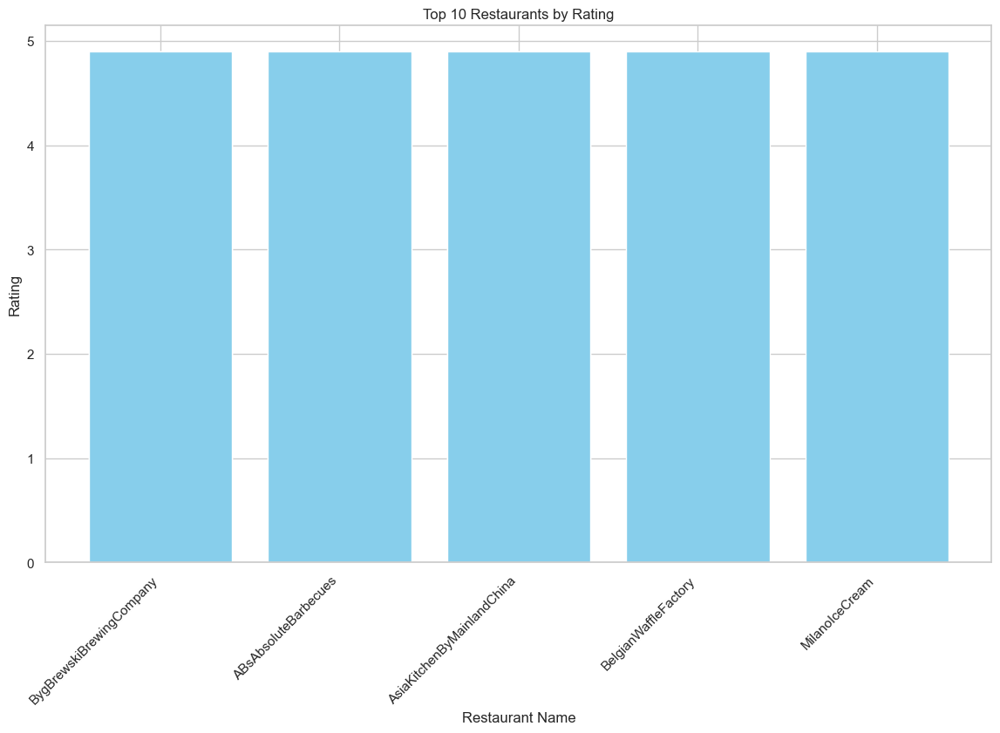

In [182]:
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with 'name' and 'rate' columns

# Sort the DataFrame by 'rate' in descending order
df_sorted = df.sort_values(by='rate', ascending=False)

# Bar plot - Name vs Rate
plt.figure(figsize=(14, 8))
plt.bar(df_sorted['name'].head(10), df_sorted['rate'].head(10), color='skyblue')
plt.title('Top 10 Restaurants by Rating')
plt.xlabel('Restaurant Name')
plt.ylabel('Rating')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.show()


In [69]:
# Distribution of Restaurants Across Different Types of Listings

after_dropping_duplicate.groupby('listed_in(type)').count()

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people)
listed_in(type),,,,,,,,,,
Buffet,672,676,676,676,676,676,676,676,676,676
Cafes,1252,1252,1252,1252,1252,1252,1252,1252,1252,1252
Delivery,16215,16220,16220,16220,16220,16220,16220,16220,16220,16220
Desserts,2478,2478,2478,2478,2478,2478,2478,2478,2478,2478
Dine-out,12960,12965,12965,12965,12965,12965,12965,12965,12965,12965
Drinks & nightlife,913,913,913,913,913,913,913,913,913,913
Pubs and bars,605,605,605,605,605,605,605,605,605,605


In [70]:
#What are the characteristics of restaurants listed under "Desserts"?

all_Desserts_data = after_dropping_duplicate[after_dropping_duplicate['listed_in(type)'] == "Desserts"]

In [71]:
all_Desserts_data

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
494,CornerHouseIceCream,No,No,4.3,345,Banashankari,Dessert Parlor,"Hot Chocolate Fudge, Vanilla Ice Cream, Fudge ...","Ice Cream, Desserts",400.000000,Desserts
495,PoonamSweets,No,No,4.4,356,Banashankari,Sweet Shop,"Dhokla, Jalebi, Badam Milk, Rabri, Rasgulla, R...",Mithai,150.000000,Desserts
496,XOBelgianWaffle,Yes,No,3.7,17,Banashankari,Dessert Parlor,No Info,"Desserts, Beverages",400.000000,Desserts
497,OldMumbaiIceCream,Yes,No,3.9,38,Banashankari,Dessert Parlor,Friendly Staff,Ice Cream,150.000000,Desserts
498,CakeoftheDay,No,No,3.7,78,Banashankari,"Bakery, Dessert Parlor",No Info,Bakery,150.000000,Desserts
499,AmmasPastries,No,No,3.8,60,Banashankari,Dessert Parlor,No Info,Bakery,400.000000,Desserts
500,KantiSweets,Yes,No,4.0,115,Banashankari,Sweet Shop,No Info,"Mithai, Street Food",400.000000,Desserts
501,SugarRush,No,No,3.8,39,Banashankari,Bakery,No Info,"Bakery, Desserts",300.000000,Desserts
502,PolarBear,Yes,No,3.9,116,Banashankari,Dessert Parlor,"Sandwiches, Hot Chocolate Fudge, Strawberry Mi...","Ice Cream, Desserts, Beverages, Sandwich",400.000000,Desserts
503,SanChurroCafe,Yes,No,3.8,918,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800.000000,Desserts


In [72]:
# Average Ratings for Each Location

average_rating_by_location = after_dropping_duplicate.groupby('location')['rate'].mean()


In [73]:
average_rating_by_location

location
BTM                              3.636349
Banashankari                     3.672300
Banaswadi                        3.549099
Bannerghatta Road                3.572932
Basavanagudi                     3.674946
Basaveshwara Nagar               3.674576
Bellandur                        3.555975
Bommanahalli                     3.418785
Brigade Road                     3.781449
Brookefield                      3.610500
CV Raman Nagar                   3.529114
Central Bangalore                3.620000
Church Street                    4.056152
City Market                      3.625882
Commercial Street                3.635366
Cunningham Road                  3.996167
Domlur                           3.569231
East Bangalore                   3.550000
Ejipura                          3.563580
Electronic City                  3.561047
Frazer Town                      3.658613
HBR Layout                       3.671000
HSR                              3.704453
Hebbal                   

In [74]:
# How many restaurants offer online orders and table booking and how many of them dont ?

online_booking_counts = after_dropping_duplicate.groupby(['online_order', 'book_table']).size()

In [75]:
online_booking_counts

online_order  book_table
No            No            11914
              Yes            2309
Yes           No            17761
              Yes            3125
dtype: int64

In [76]:
#What is the most liked dish in each cuisine category? 

most_liked_dish_by_cuisine = after_dropping_duplicate.groupby('cuisines')['dish_liked'].agg(lambda x: x.mode().iat[0] if not x.mode().empty else 'No specific dish')

In [77]:
most_liked_dish_by_cuisine

cuisines
African, Burger                                                                           Chicken Grill, Garlic Bread, Mocktails, Burger...
African, Burger, Desserts, Beverages, Fast Food                                           Garlic Bread, Peri Peri Chicken, Burgers, Chic...
American                                                                                                                            No Info
American, Asian, Continental, North Indian, South Indian, Chinese                         Cocktails, Noodles, Chips, Shephards Pie, Lamb...
American, Asian, European, North Indian                                                   Cocktails, Burgers, Nachos, Sandwiches, Butter...
American, BBQ                                                                             Burgers, Cocktails, Legendary Hrc Burger, Nach...
American, Bakery, Beverages, Cafe, Healthy Food, Juices, North Indian, Sandwich                                                     No Info
American, B

In [78]:
# What is the average cost for two people in each restaurant type? T

average_cost_by_rest_type = after_dropping_duplicate.groupby('rest_type')['approx_cost(for two people)'].mean()


In [79]:
average_cost_by_rest_type 

rest_type
Bakery                            376.467391
Bakery, Beverage Shop             170.000000
Bakery, Cafe                      595.070423
Bakery, Dessert Parlor            367.000000
Bakery, Food Court                500.000000
Bakery, Kiosk                     597.040343
Bakery, Quick Bites               398.769729
Bakery, Sweet Shop                200.000000
Bar                              1250.835364
Bar, Cafe                        1000.000000
Bar, Casual Dining               1365.424015
Bar, Lounge                      2450.000000
Bar, Pub                          850.000000
Bar, Quick Bites                 2000.000000
Beverage Shop                     229.346939
Beverage Shop, Cafe               468.421053
Beverage Shop, Dessert Parlor     378.571429
Beverage Shop, Quick Bites        279.320419
Bhojanalya                        300.000000
Cafe                              633.390939
Cafe, Bakery                      613.025210
Cafe, Bar                        1200.000000


In [80]:
# How many restaurants are listed under each type? 

restaurant_count_by_listed_type = after_dropping_duplicate.groupby('listed_in(type)').size()


In [81]:
restaurant_count_by_listed_type

listed_in(type)
Buffet                  676
Cafes                  1252
Delivery              16220
Desserts               2478
Dine-out              12965
Drinks & nightlife      913
Pubs and bars           605
dtype: int64

In [82]:
#Which cuisines have the highest average ratings?

top_cuisines_by_rating =after_dropping_duplicate.groupby('cuisines')['rate'].mean().sort_values(ascending=False)

In [83]:
top_cuisines_by_rating

cuisines
Continental, North Indian, Italian, South Indian, Finger Food                             4.900000
Healthy Food, Salad, Mediterranean                                                        4.900000
Asian, Chinese, Thai, Momos                                                               4.900000
Asian, Mediterranean, North Indian, BBQ                                                   4.800000
North Indian, European, Mediterranean, BBQ                                                4.800000
European, Mediterranean, North Indian, BBQ                                                4.783333
American, Tex-Mex, Burger, BBQ, Mexican                                                   4.750000
Continental, European, BBQ, Chinese, Asian                                                4.700000
BBQ, North Indian, Continental, Chinese                                                   4.700000
Asian, Burmese                                                                            4.700000
S

In [84]:
#Calculate the average rating for restaurants with and without table booking. Group by the "book_table" column and find the mean of the "rate" column.

average_rating_by_booking = after_dropping_duplicate.groupby('book_table')['rate'].mean()

In [85]:
average_rating_by_booking

book_table
No     3.647983
Yes    4.155558
Name: rate, dtype: float64

In [86]:
#Identify the top restaurants that offer online orders based on the number of votes. Sort by the "votes" column for restaurants with online orders

top_online_order_restaurants = after_dropping_duplicate[after_dropping_duplicate['online_order'] == 'Yes'].sort_values(by='votes', ascending=False).head(10)

In [87]:
top_online_order_restaurants

,name,online_order,book_table,rate,votes,location,rest_type,dish_liked,cuisines,approx_cost(for two people),listed_in(type)
50059,BygBrewskiBrewingCompany,Yes,Yes,4.9,16832,Sarjapur Road,Microbrewery,"Cocktails, Butter Chicken, Dahi Kebab, Rajma C...","Continental, North Indian, Italian, South Indi...",1600.0,Drinks & nightlife
49170,BygBrewskiBrewingCompany,Yes,Yes,4.9,16832,Sarjapur Road,Microbrewery,"Cocktails, Butter Chicken, Dahi Kebab, Rajma C...","Continental, North Indian, Italian, South Indi...",1600.0,Delivery
49627,BygBrewskiBrewingCompany,Yes,Yes,4.9,16832,Sarjapur Road,Microbrewery,"Cocktails, Butter Chicken, Dahi Kebab, Rajma C...","Continental, North Indian, Italian, South Indi...",1600.0,Dine-out
4801,BygBrewskiBrewingCompany,Yes,Yes,4.9,16345,Sarjapur Road,Microbrewery,"Cocktails, Dahi Kebab, Rajma Chawal, Butter Ch...","Continental, North Indian, Italian, South Indi...",1600.0,Dine-out
3921,BygBrewskiBrewingCompany,Yes,Yes,4.9,16345,Sarjapur Road,Microbrewery,"Cocktails, Dahi Kebab, Rajma Chawal, Butter Ch...","Continental, North Indian, Italian, South Indi...",1600.0,Delivery
4944,BygBrewskiBrewingCompany,Yes,Yes,4.9,16345,Sarjapur Road,Microbrewery,"Cocktails, Dahi Kebab, Rajma Chawal, Butter Ch...","Continental, North Indian, Italian, South Indi...",1600.0,Drinks & nightlife
36424,Onesta,Yes,Yes,4.4,9085,Koramangala 4th Block,"Casual Dining, Cafe","Berryblast, Gourmet Pizza, Mocktails, Ravioli,...","Pizza, Cafe, Italian",600.0,Desserts
36690,Onesta,Yes,Yes,4.4,9085,Koramangala 4th Block,"Casual Dining, Cafe","Berryblast, Gourmet Pizza, Mocktails, Ravioli,...","Pizza, Cafe, Italian",600.0,Dine-out
34958,Onesta,Yes,Yes,4.4,9084,Koramangala 4th Block,"Casual Dining, Cafe","Berryblast, Gourmet Pizza, Mocktails, Ravioli,...","Pizza, Cafe, Italian",600.0,Delivery
34737,Onesta,Yes,Yes,4.4,9084,Koramangala 4th Block,"Casual Dining, Cafe","Berryblast, Gourmet Pizza, Mocktails, Ravioli,...","Pizza, Cafe, Italian",600.0,Buffet


In [88]:
#Explore the distribution of ratings. Group by the "rate" column and count the occurrences of each rating.
rating_distribution = after_dropping_duplicate.groupby('rate').size()

In [89]:
rating_distribution 

rate
1.8       2
2.0      10
2.1      19
2.2      12
2.3      37
2.4      58
2.5      71
2.6     185
2.7     217
2.8     423
2.9     563
3.0     738
3.1    1052
3.2    1292
3.3    1533
3.4    1646
3.5    1804
3.6    2188
3.7    7721
3.8    2602
3.9    2891
4.0    2409
4.1    2282
4.2    1738
4.3    1444
4.4    1010
4.5     608
4.6     276
4.7     166
4.8      60
4.9      52
dtype: int64

In [90]:
#Identify the top locations with the highest average votes. Group by the "location" column and calculate the mean of the "votes" column.

top_locations_by_votes = after_dropping_duplicate.groupby('location')['votes'].mean().sort_values(ascending=False)

In [91]:
top_locations_by_votes .head(10)

location
Church Street            1243.881432
Koramangala 5th Block    1225.415896
Lavelle Road             1132.890000
St. Marks Road           1011.551020
Koramangala 4th Block    1004.081494
Cunningham Road           865.466899
Koramangala 3rd Block     681.736434
Koramangala 7th Block     645.300955
Indiranagar               642.128348
MG Road                   639.527051
Name: votes, dtype: float64

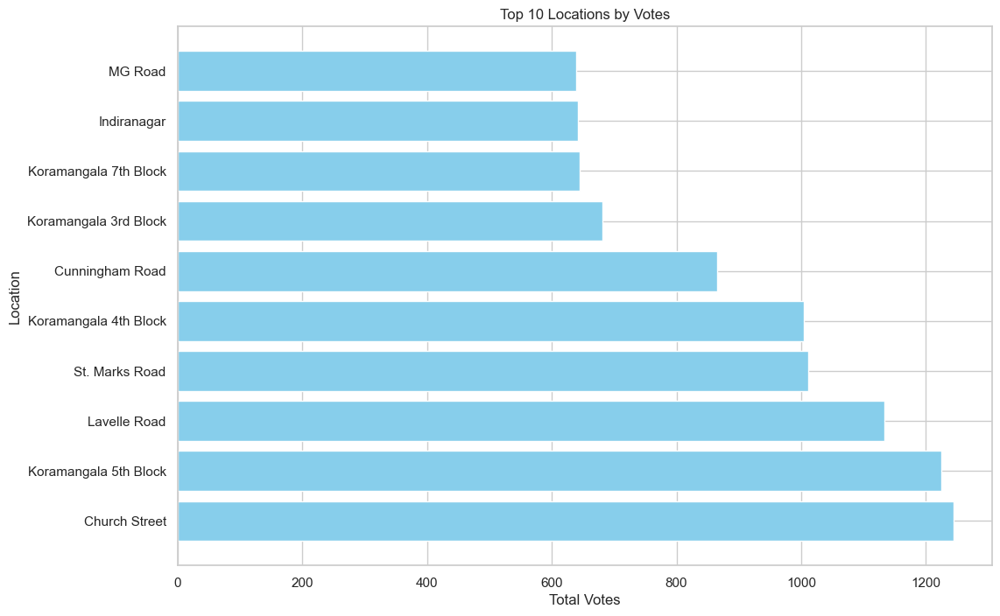

In [183]:
import matplotlib.pyplot as plt

# Sort the Series values in descending order and take the top 10
top_locations = top_locations_by_votes.sort_values(ascending=False).head(10)

# Bar plot - Top 10 Locations by Votes
plt.figure(figsize=(12, 8))
plt.barh(top_locations.index, top_locations.values, color='skyblue')
plt.title('Top 10 Locations by Votes')
plt.xlabel('Total Votes')
plt.ylabel('Location')
plt.show()




In [92]:
#How many restaurants in each location offer a buffet? Filter the data for buffet restaurants, group by the "location" column, and count.

buffet_counts_by_location = after_dropping_duplicate[after_dropping_duplicate['listed_in(type)'] == 'Buffet'].groupby('location').size()


In [93]:
buffet_counts_by_location.head(10)

location
BTM                   17
Banashankari           5
Bannerghatta Road      8
Basavanagudi           4
Basaveshwara Nagar     2
Bellandur             28
Bommanahalli           2
Brigade Road          13
Brookefield            6
Church Street         19
dtype: int64

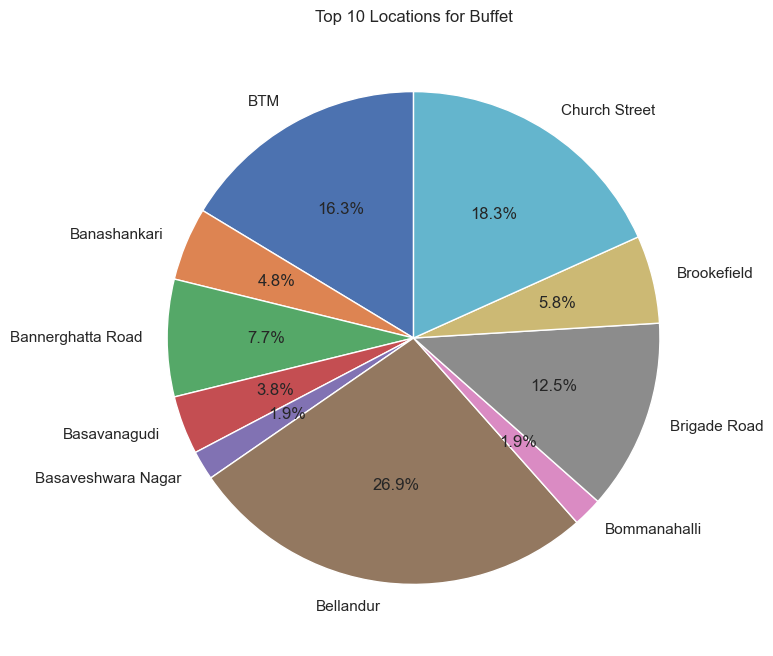

In [184]:
import matplotlib.pyplot as plt

# Get the top 10 locations
top_locations = buffet_counts_by_location.head(10)

# Pie chart - Buffet Counts by Location
plt.figure(figsize=(8, 8))
plt.pie(top_locations, labels=top_locations.index, autopct='%1.1f%%', startangle=90)
plt.title('Top 10 Locations for Buffet')
plt.show()


In [94]:
#Identify the cuisines with the highest average cost for two people. Group by the "cuisines" column and calculate the mean of the "approx_cost(for two people)" column.
expensive_cuisines = after_dropping_duplicate.groupby('cuisines')['approx_cost(for two people)'].mean().sort_values(ascending=False)


In [95]:
expensive_cuisines.head(10)

cuisines
French, Italian                                               6000.0
North Indian, Continental, Japanese, Chinese, South Indian    4100.0
Steak, Mediterranean, Grill                                   4000.0
North Indian, Kashmiri, Mughlai                               3700.0
North Indian, Italian, Asian, Continental, Mediterranean      3500.0
Thai, Japanese, Chinese                                       3500.0
Mangalorean, Konkan, Seafood, Kerala                          3500.0
North Indian, Italian, Chinese, Japanese                      3400.0
North Indian, European, Thai                                  3400.0
North Indian, Mediterranean, Chinese                          3000.0
Name: approx_cost(for two people), dtype: float64

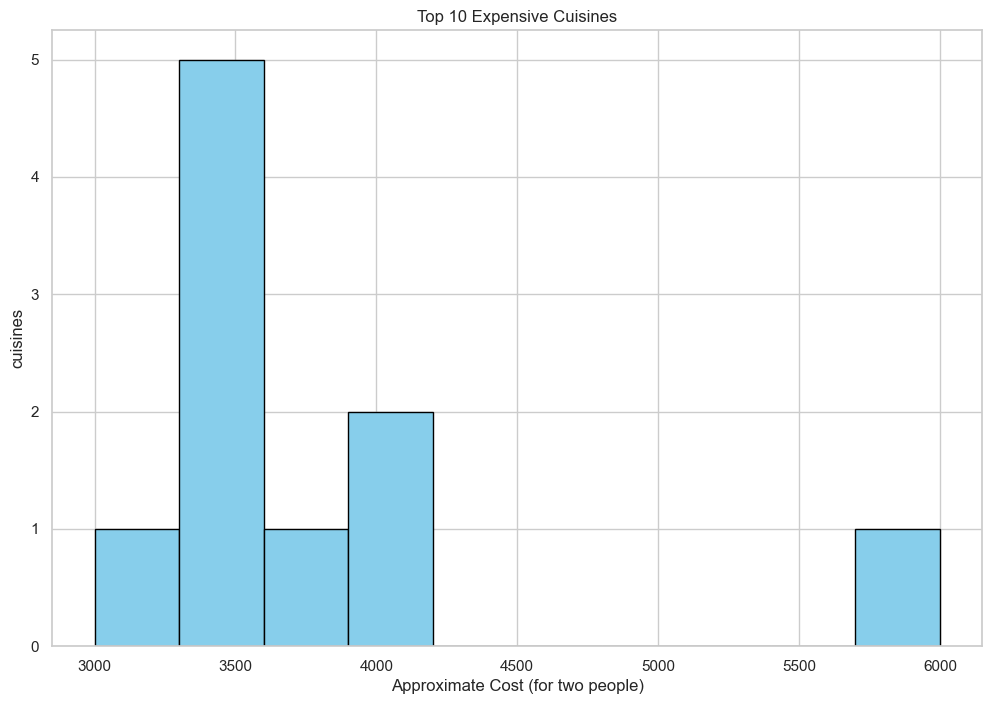

In [185]:
import matplotlib.pyplot as plt

# Plot histogram for the top 10 expensive cuisines
plt.figure(figsize=(12, 8))
plt.hist(expensive_cuisines.head(10), bins=10, color='skyblue', edgecolor='black')
plt.title('Top 10 Expensive Cuisines')
plt.xlabel('Approximate Cost (for two people)')
plt.ylabel('cuisines')
plt.show()




In [96]:
#Identify the busiest locations based on the number of restaurants. Group by the "location" column and count the number of restaurants in each location.

busiest_locations = after_dropping_duplicate.groupby('location').size().sort_values(ascending=False)



In [97]:
busiest_locations.head(10)

location
BTM                      2520
Whitefield               1972
Indiranagar              1792
HSR                      1774
Marathahalli             1683
Koramangala 5th Block    1623
JP Nagar                 1426
Jayanagar                1253
Electronic City          1222
Bellandur                1138
dtype: int64

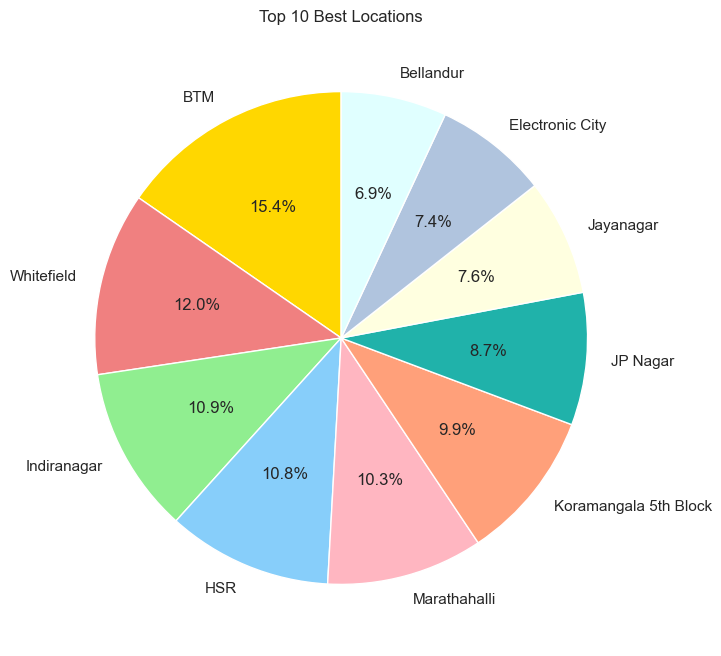

In [170]:
import matplotlib.pyplot as plt

# Get the top 10 locations
top_locations = busiest_locations.head(10)

# Pie chart - Best Locations
plt.figure(figsize=(8, 8))
colors = ['gold', 'lightcoral', 'lightgreen', 'lightskyblue', 'lightpink', 'lightsalmon', 'lightseagreen', 'lightyellow', 'lightsteelblue', 'lightcyan']
plt.pie(top_locations, labels=top_locations.index, autopct='%1.1f%%', startangle=90, colors=colors)
plt.title('Top 10 Best Locations')
plt.show()


In [98]:
# Find the count, average cost for two people, and average rating for each restaurant type

rest_type_ = after_dropping_duplicate.groupby('rest_type').agg({
    'name': 'count',
    'approx_cost(for two people)': 'mean',
    'rate': 'mean'
})


In [99]:
rest_type_ .head(10)

,name,approx_cost(for two people),rate
rest_type,,,
Bakery,736,376.467391,3.635462
"Bakery, Beverage Shop",5,170.000000,3.600000
"Bakery, Cafe",71,595.070423,3.976056
"Bakery, Dessert Parlor",100,367.000000,3.698000
"Bakery, Food Court",2,500.000000,3.100000
"Bakery, Kiosk",4,597.040343,3.700000
"Bakery, Quick Bites",177,398.769729,3.439548
"Bakery, Sweet Shop",1,200.000000,3.700000
Bar,482,1250.835364,3.788174


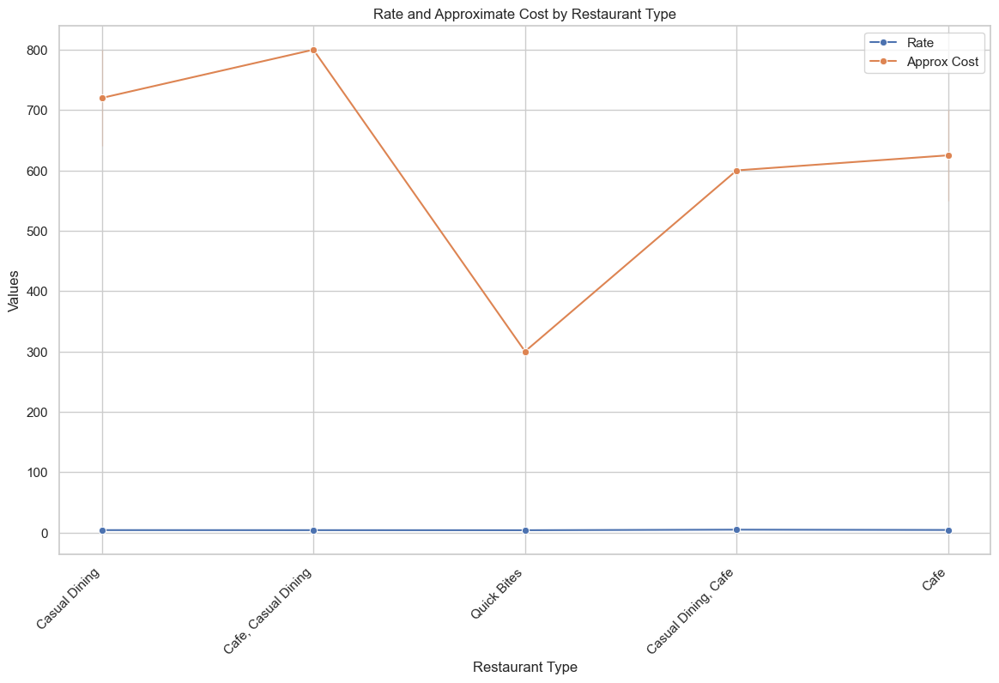

In [175]:
import seaborn as sns
import matplotlib.pyplot as plt

selected_data = df[['rest_type', 'approx_cost(for two people)', 'rate']].head(10)

# Convert 'approx_cost(for two people)' to numeric (remove commas and convert to float)
selected_data['approx_cost'] = selected_data['approx_cost(for two people)'].replace('[\$,]', '', regex=True).astype(float)

# Line plot - Rate and Approximate Cost by Restaurant Type
plt.figure(figsize=(14, 8))
sns.lineplot(x='rest_type', y='rate', data=selected_data, marker='o', label='Rate')
sns.lineplot(x='rest_type', y='approx_cost', data=selected_data, marker='o', label='Approx Cost')
plt.title('Rate and Approximate Cost by Restaurant Type')
plt.xlabel('Restaurant Type')
plt.ylabel('Values')
plt.xticks(rotation=45, ha='right') 
plt.legend()
plt.show()



In [100]:
#Calculate the count, average cost for two people, and highest rating for each cuisine.

cuisine =  after_dropping_duplicate.groupby('cuisines').agg({
    'name': 'count',
    'approx_cost(for two people)': 'mean',
    'rate': 'max'})

In [101]:
cuisine.head(10)

,name,approx_cost(for two people),rate
cuisines,,,
"African, Burger",10,1000.000000,4.6
"African, Burger, Desserts, Beverages, Fast Food",2,1000.000000,4.6
American,11,709.090909,4.2
"American, Asian, Continental, North Indian, South Indian, Chinese",12,1200.000000,4.1
"American, Asian, European, North Indian",8,1400.000000,4.3
"American, BBQ",12,2500.000000,4.5
"American, Bakery, Beverages, Cafe, Healthy Food, Juices, North Indian, Sandwich",2,300.000000,3.7
"American, Burger, Fast Food",7,400.000000,4.3
"American, Burger, Italian, Steak",3,1700.000000,3.9


In [102]:
#Identify the popular cuisines for restaurants that offer online orders and those that do not. Group by the "online_order" column and list the top 2 cuisines based on the count.

top_cuisines_by_online_order =  after_dropping_duplicate.groupby(['online_order', 'cuisines']).size().groupby('online_order').nlargest(2).reset_index(level=0, drop=True)

In [103]:
top_cuisines_by_online_order 

online_order  cuisines             
No            North Indian              740
              North Indian, Chinese     703
Yes           North Indian             1192
              North Indian, Chinese     884
dtype: int64

In [104]:
# Calculate the average rating and total votes for restaurants with an approximate cost for two people greater than 1500. Group by the "approx_cost(for two people)" column and find the mean of the "rate" and sum of the "votes" columns.

high_cost_restaurants =  after_dropping_duplicate[ after_dropping_duplicate['approx_cost(for two people)'] > 1500] 
high_cost_stats = high_cost_restaurants.agg({
    'rate': 'mean',
    'votes': 'sum'
}) 




In [105]:
high_cost_stats 

rate     4.197151e+00
votes    2.059177e+06
dtype: float64

In [106]:
df=after_dropping_duplicate

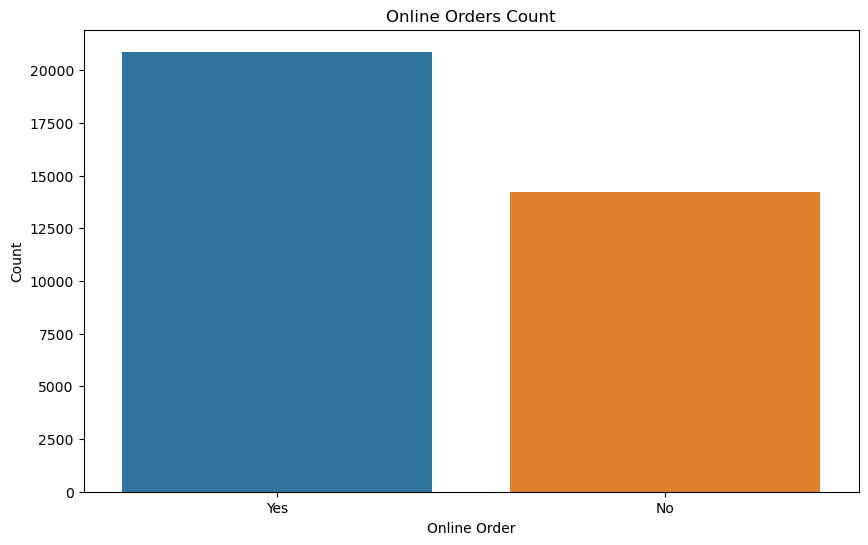

In [107]:
# Bar plot for online order 
plt.figure(figsize=(10, 6))
sns.countplot(x='online_order', data=df)
plt.title('Online Orders Count')
plt.xlabel('Online Order')
plt.ylabel('Count')
plt.show()

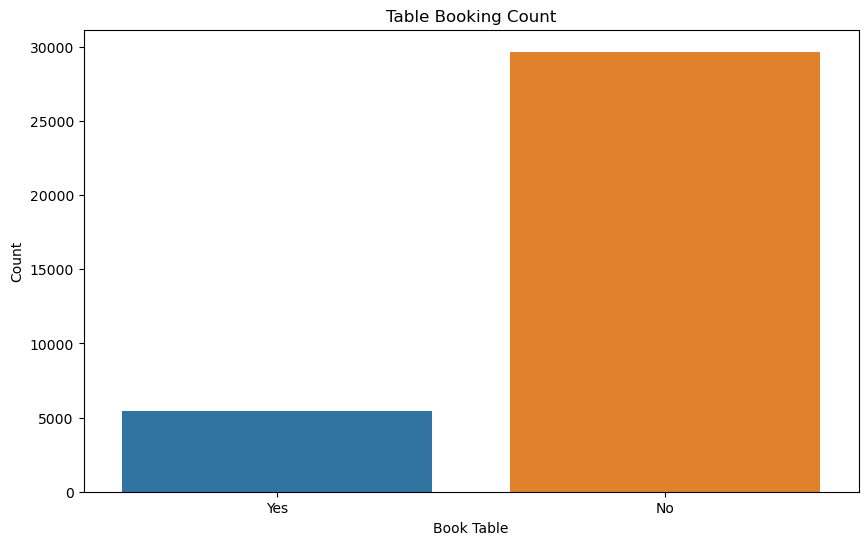

In [108]:
#Bar plot for booking table 
plt.figure(figsize=(10, 6))
sns.countplot(x='book_table', data=df)
plt.title('Table Booking Count')
plt.xlabel('Book Table')
plt.ylabel('Count')
plt.show()

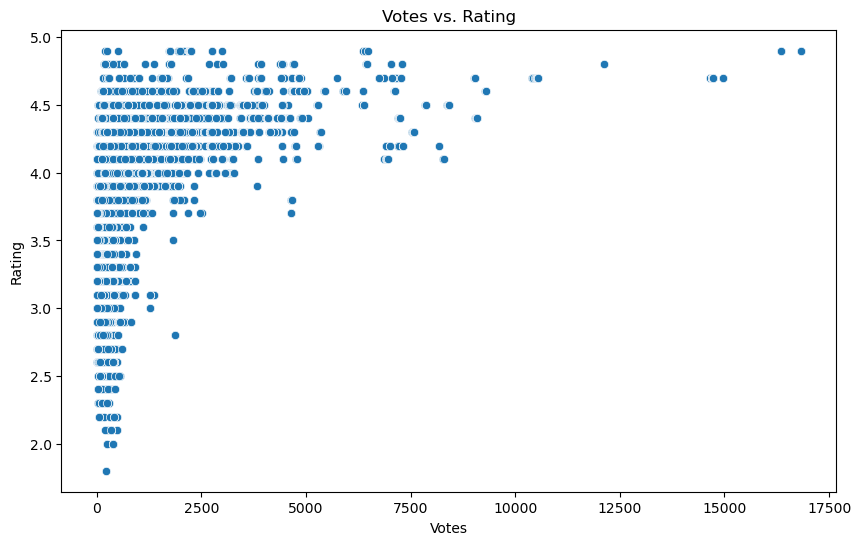

In [109]:
# scatter plot - voting vs rating 
plt.figure(figsize=(10, 6))
sns.scatterplot(x='votes', y='rate', data=df)
colors = ['#FF0000','#89CFF0']
sns.set_palette(sns.color_palette(colors))
plt.title('Votes vs. Rating')
plt.xlabel('Votes')
plt.ylabel('Rating')
plt.show()

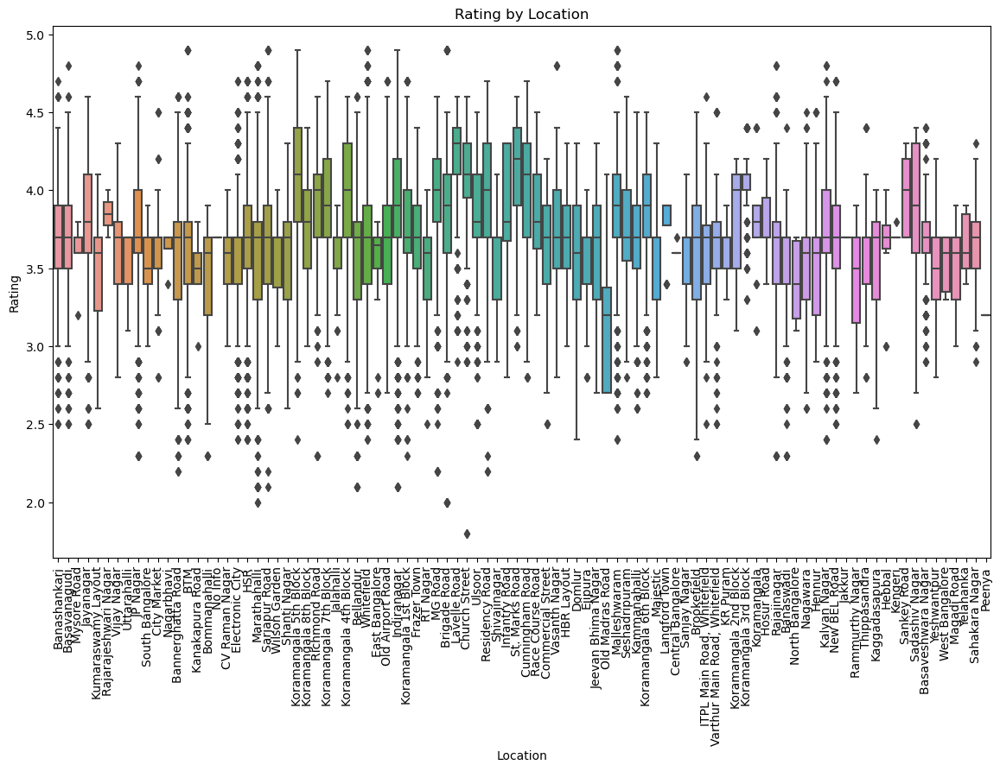

In [110]:
## Box plot - Rating by Location
plt.figure(figsize=(14, 8))
sns.boxplot(x='location', y='rate', data=df)
plt.title('Rating by Location')
plt.xlabel('Location')
plt.ylabel('Rating')
plt.xticks(rotation=90)
plt.show()

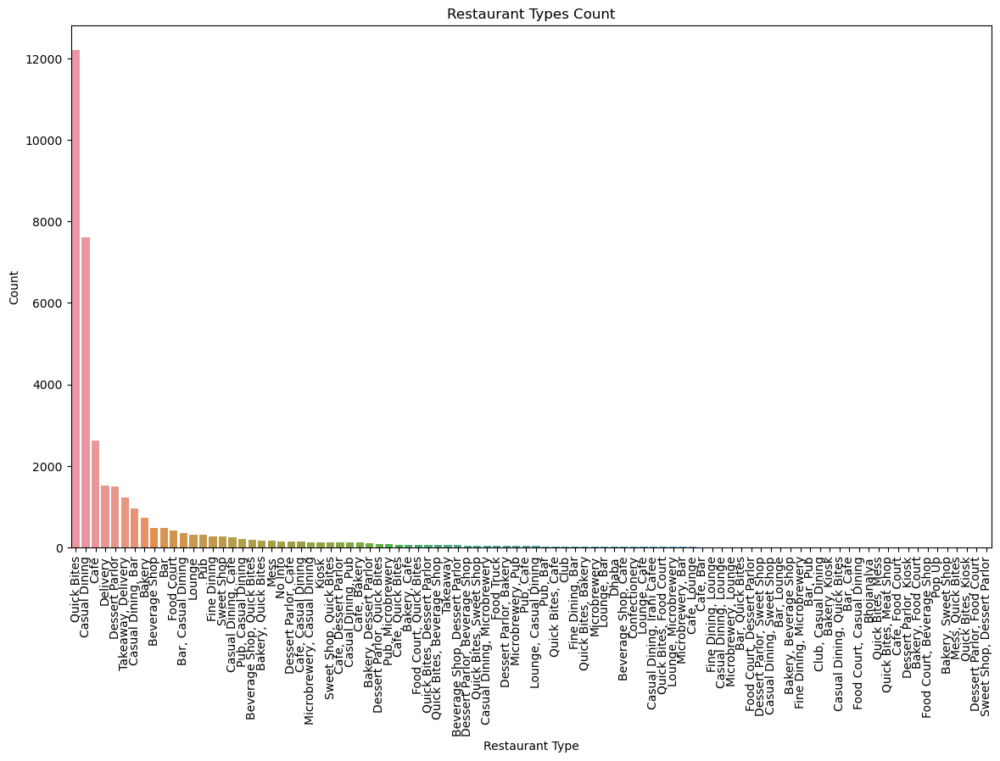

In [111]:
# Count plot - Restaurant Types
plt.figure(figsize=(14, 8))
sns.countplot(x='rest_type', data=df, order=df['rest_type'].value_counts().index)
plt.title('Restaurant Types Count')
plt.xlabel('Restaurant Type')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

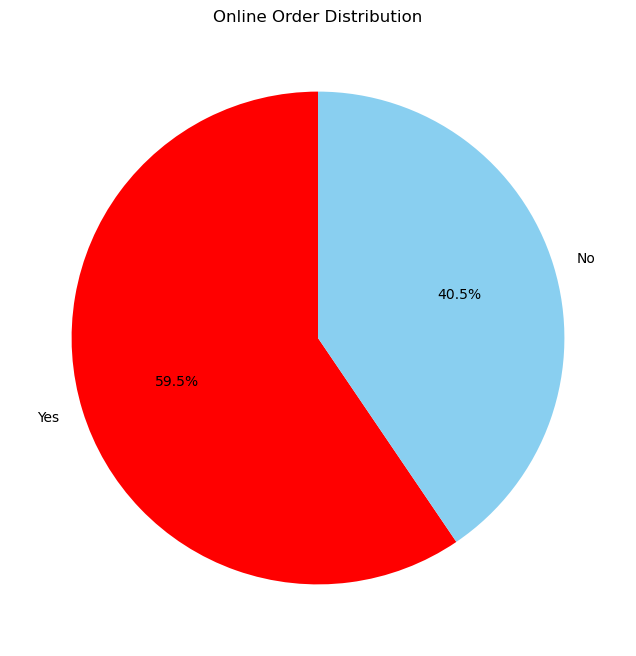

In [112]:
# Pie chart - Online Order Distribution
online_order_counts = df['online_order'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(online_order_counts, labels=online_order_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Online Order Distribution')
plt.show()

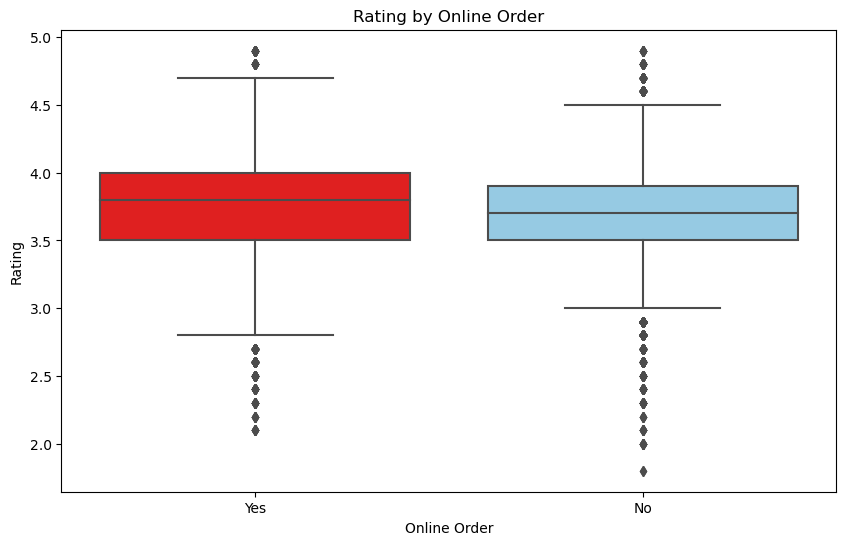

In [113]:
# Box plot - Rating by Online Order
plt.figure(figsize=(10, 6))
sns.boxplot(x='online_order', y='rate', data=df)
plt.title('Rating by Online Order')
plt.xlabel('Online Order')
plt.ylabel('Rating')
plt.show()

C:\Users\priya\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


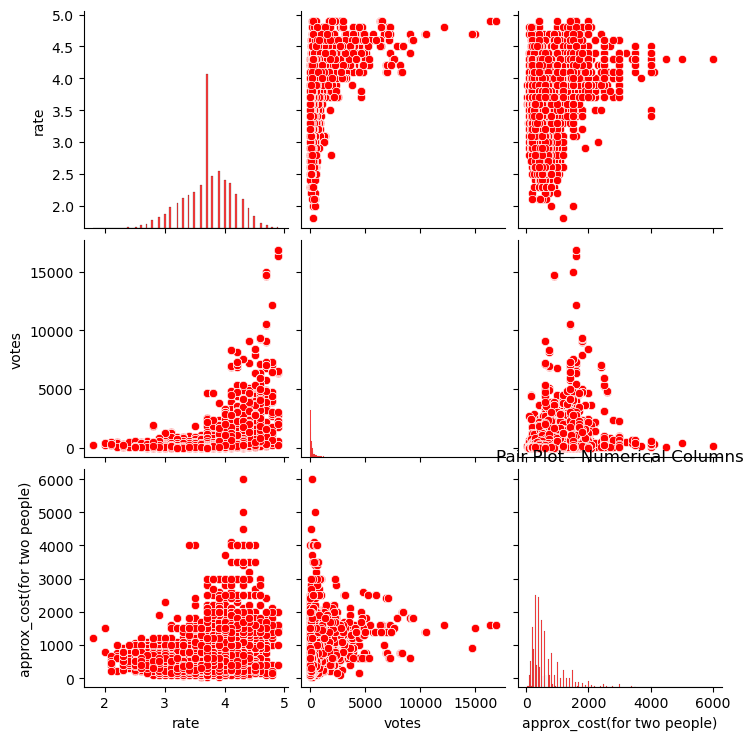

In [114]:
# Pair plot - Correlation between numerical columns
numerical_cols = ['rate', 'votes', 'approx_cost(for two people)']
sns.pairplot(df[numerical_cols])
plt.title('Pair Plot - Numerical Columns')
plt.show()

C:\Users\priya\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


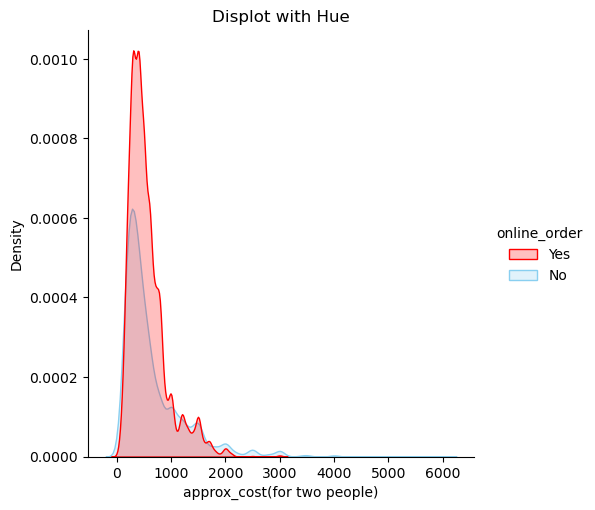

In [115]:
# Displot with Hue
sns.displot(df, x='approx_cost(for two people)', hue='online_order', kind='kde', fill=True)
plt.title('Displot with Hue')
plt.show()

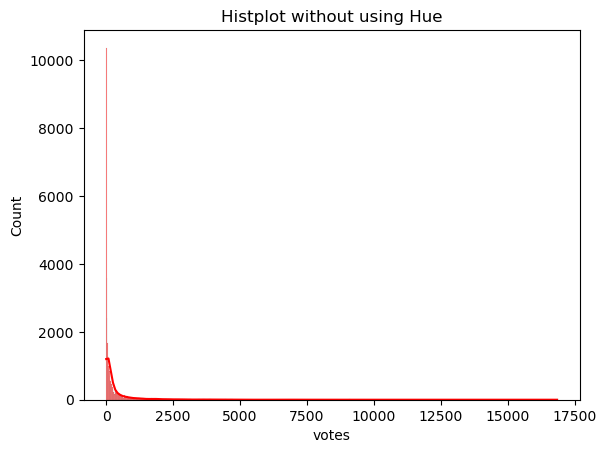

In [116]:
# Histplot without using 'online_order' and 'book_table'
sns.histplot(df, x='votes', multiple='stack', kde=True)
plt.title('Histplot without using Hue')
plt.show()

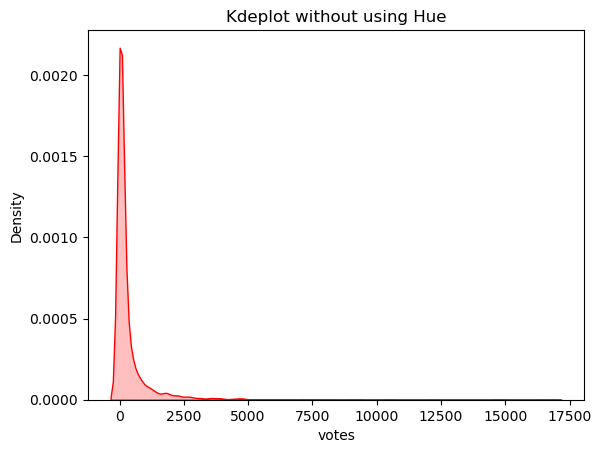

In [117]:
# Kdeplot without using 'online_order' and 'book_table'
sns.kdeplot(df, x='votes', fill=True)
plt.title('Kdeplot without using Hue')
plt.show()

C:\Users\priya\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


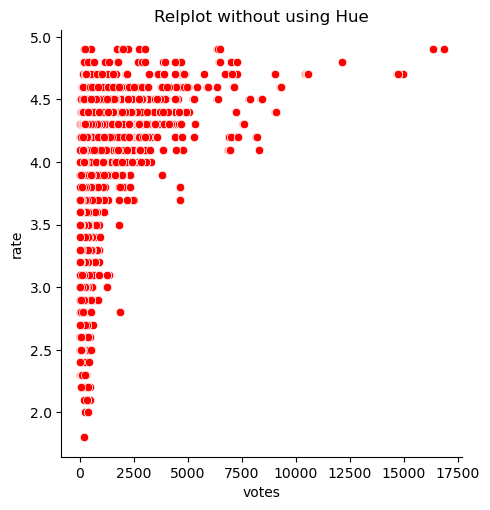

In [118]:
# Relplot (Scatterplot) without using 'online_order' and 'book_table'
sns.relplot(data=df, x='votes', y='rate', kind='scatter')
plt.title('Relplot without using Hue')
plt.show()

C:\Users\priya\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


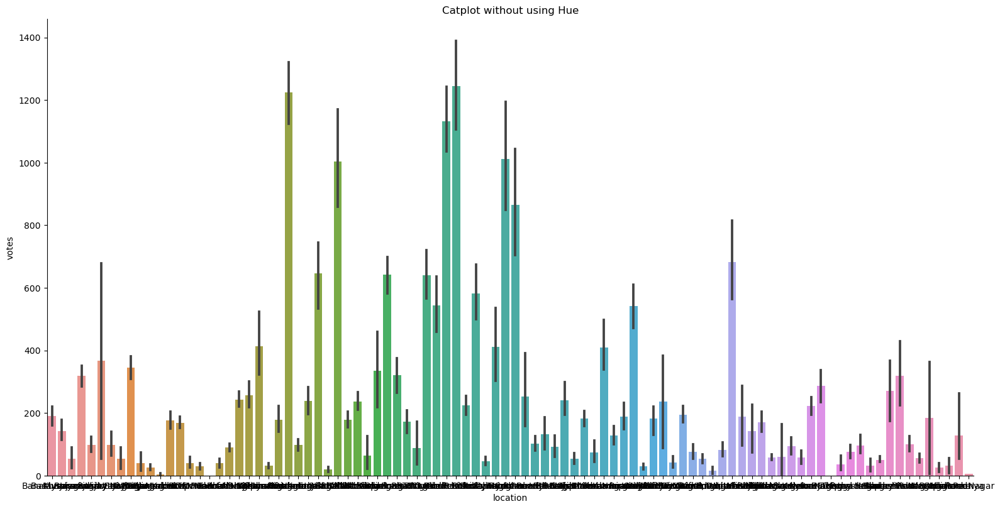

In [119]:
# Catplot without using 'online_order' and 'book_table'
sns.catplot(data=df, x='location', y='votes', kind='bar', height=8, aspect=2)
plt.title('Catplot without using Hue')
plt.show()

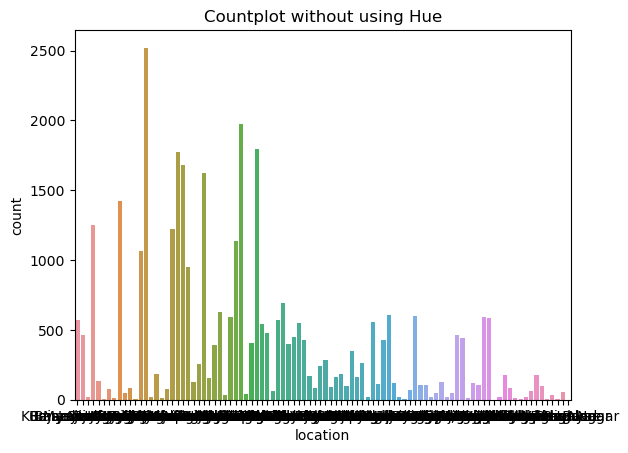

In [120]:
# Countplot without using 'online_order' and 'book_table'
sns.countplot(data=df, x='location')
plt.title('Countplot without using Hue')
plt.show()

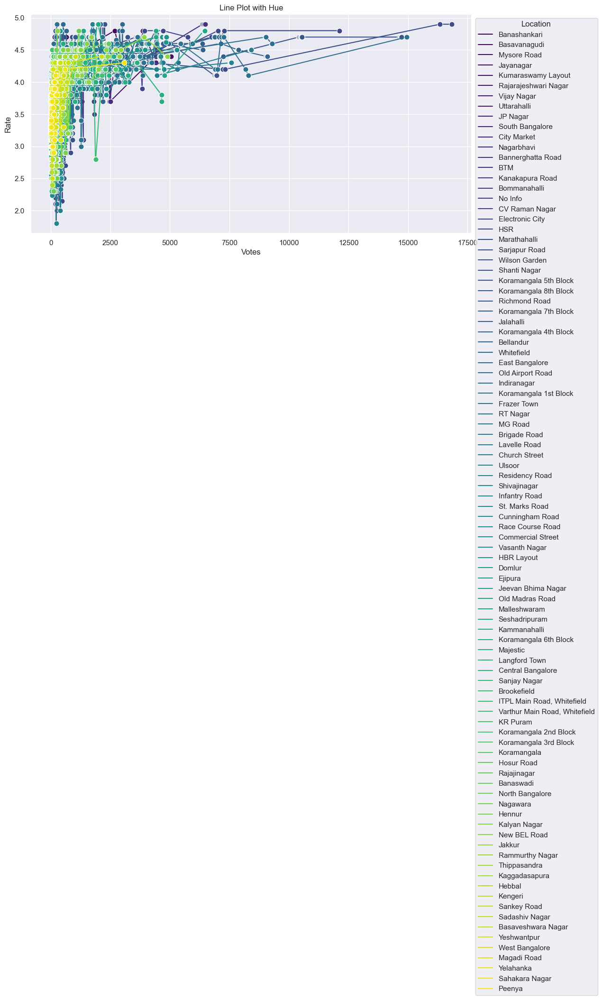

In [121]:
# Line plot with 'votes' on the x-axis and 'rate' on the y-axis
sns.set(style="darkgrid")
plt.figure(figsize=(12, 6))

sns.lineplot(data=df, x='votes', y='rate', hue='location', marker='o', markersize=8, palette='viridis')

plt.title('Line Plot with Hue')
plt.xlabel('Votes')
plt.ylabel('Rate')
plt.legend(title='Location', loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

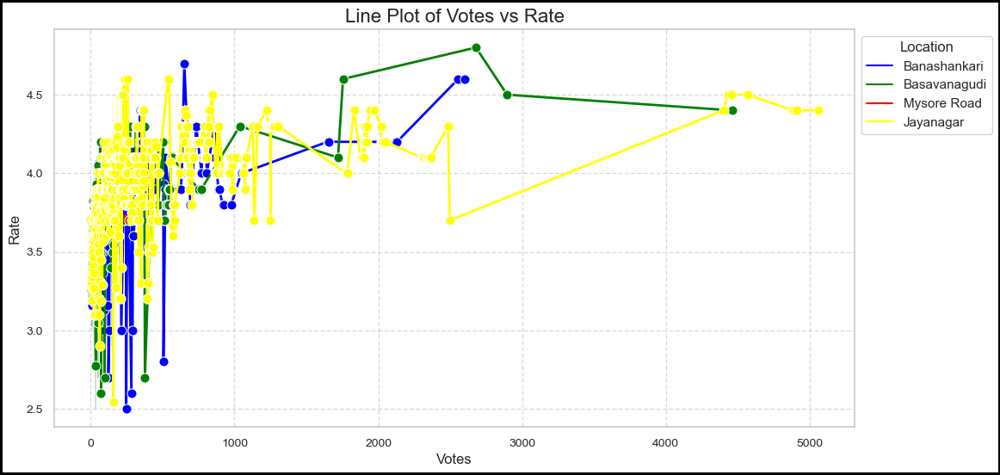

In [186]:
import seaborn as sns
import matplotlib.pyplot as plt

df = df.dropna(subset=['votes', 'rate'])

# Selecting a subset of locations for better visualization
selected_locations = df['location'].unique()[:4]

# Filter the DataFrame based on selected locations
df_subset = df[df['location'].isin(selected_locations)]

# Set up the figure
figure, ax = plt.subplots(figsize=(12, 6), linewidth=4, edgecolor='black')

# Create a line plot with 'votes' on the x-axis and 'rate' on the y-axis, colored by 'location'
sns.lineplot(data=df_subset, x='votes', y='rate', hue='location', marker='o', palette=['blue', 'green', 'red', 'yellow'], linewidth=2, markersize=8)

# Customize the plot
ax.legend(title='Location', loc='upper left', bbox_to_anchor=(1, 1))
ax.grid(True, linestyle='--', alpha=0.7)
ax.set_title('Line Plot of Votes vs Rate', fontsize=16)
ax.set_xlabel('Votes', fontsize=12)
ax.set_ylabel('Rate', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()




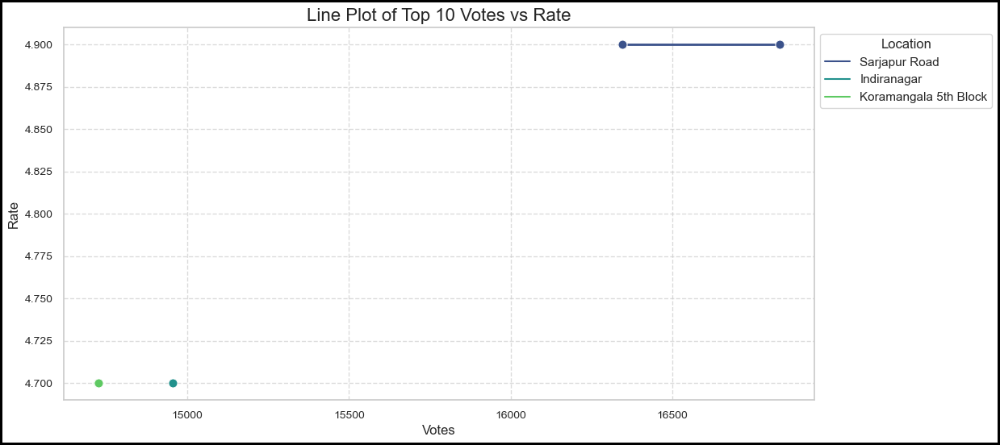

In [187]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with the provided columns
# Drop rows with missing values in the 'votes' or 'rate' columns
df = df.dropna(subset=['votes', 'rate'])

# Select the top 10 rows based on 'votes'
top_10_votes_rate = df.nlargest(10, 'votes')

# Set up the figure
figure, ax = plt.subplots(figsize=(12, 6), linewidth=4, edgecolor='black')

# Create a line plot with 'votes' on the x-axis and 'rate' on the y-axis, colored by 'location'
sns.lineplot(data=top_10_votes_rate, x='votes', y='rate', hue='location', marker='o', palette='viridis', linewidth=2, markersize=8)

# Customize the plot
ax.legend(title='Location', loc='upper left', bbox_to_anchor=(1, 1))
ax.grid(True, linestyle='--', alpha=0.7)
ax.set_title('Line Plot of Top 10 Votes vs Rate', fontsize=16)
ax.set_xlabel('Votes', fontsize=12)
ax.set_ylabel('Rate', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Show the plot
plt.show()



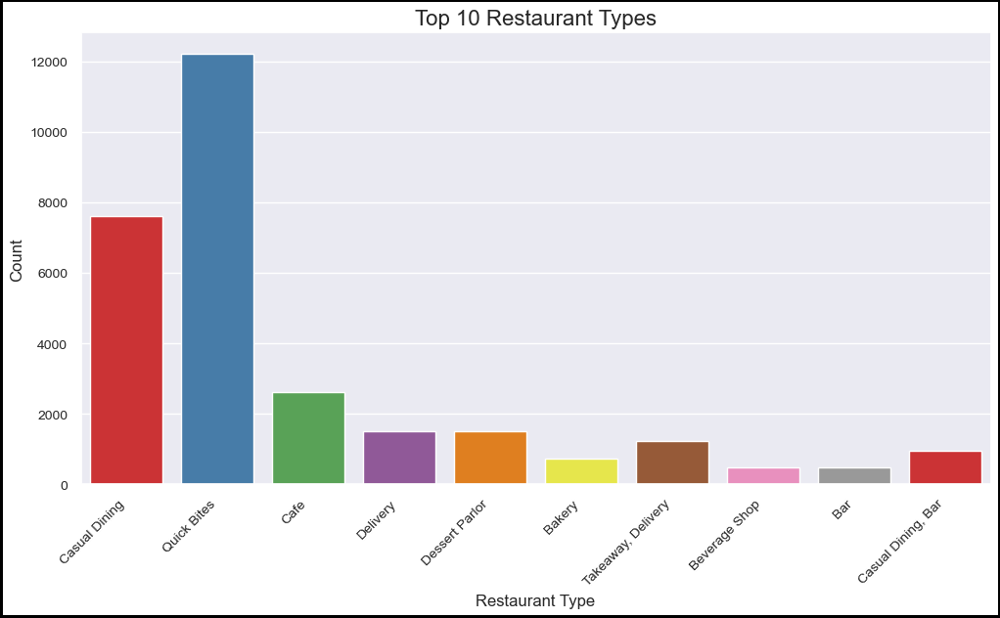

In [131]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with the provided columns
# Drop rows with missing values in the 'rest_type' column
df = df.dropna(subset=['rest_type'])

# Select the top 10 'rest_type' values
top_10_rest_type = df['rest_type'].value_counts().nlargest(10).index

# Filter the DataFrame based on the top 10 'rest_type' values
df_top_10_rest_type = df[df['rest_type'].isin(top_10_rest_type)]

# Set up the figure
figure, ax = plt.subplots(figsize=(12, 6), linewidth=4, edgecolor='black')

# Create a countplot for 'rest_type' with different colors for each category
sns.countplot(data=df_top_10_rest_type, x='rest_type', palette='Set1')

# Customize the plot
ax.set_title('Top 10 Restaurant Types', fontsize=16)
ax.set_xlabel('Restaurant Type', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)

# Show the plot
plt.show()


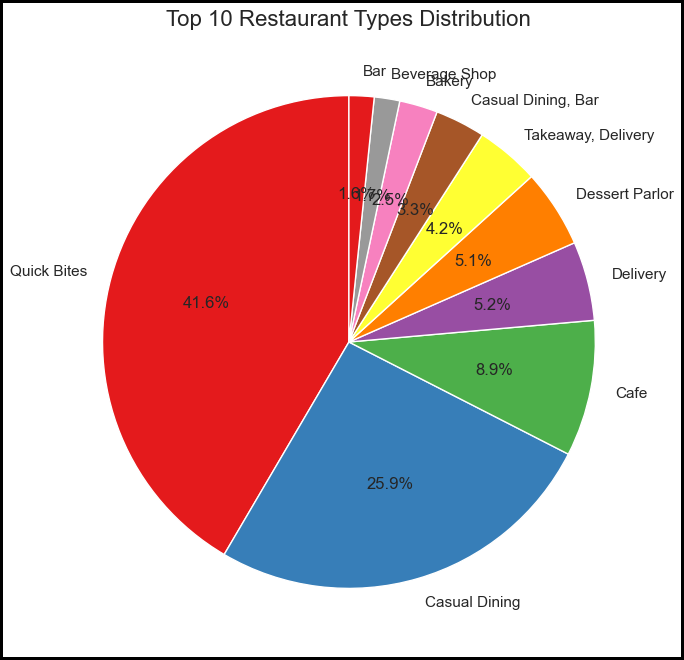

In [132]:
import matplotlib.pyplot as plt
import pandas as pd

df = df.dropna(subset=['rest_type'])

# Select the top 10 'rest_type' values
top_10_rest_type = df['rest_type'].value_counts().nlargest(10)

# Set up the figure
figure, ax = plt.subplots(figsize=(8, 8), linewidth=4, edgecolor='black')

# Create a pie chart for 'rest_type'
ax.pie(top_10_rest_type, labels=top_10_rest_type.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Set1.colors)

# Customize the plot
ax.set_title('Top 10 Restaurant Types Distribution', fontsize=16)

plt.show()


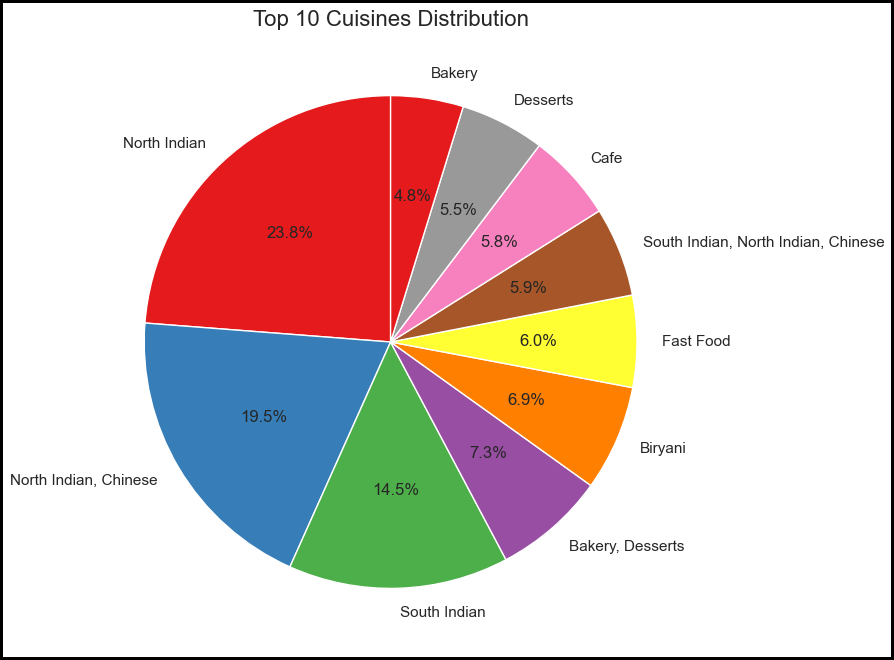

In [133]:
import matplotlib.pyplot as plt

df = df.dropna(subset=['cuisines'])

# Select the top 10 'cuisines' values
top_10_cuisines = df['cuisines'].value_counts().nlargest(10)

# Set up the figure
figure, ax = plt.subplots(figsize=(8, 8), linewidth=4, edgecolor='black')

# Create a pie chart for 'cuisines'
ax.pie(top_10_cuisines, labels=top_10_cuisines.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Set1.colors)

# Customize the plot
ax.set_title('Top 10 Cuisines Distribution', fontsize=16)

plt.show()


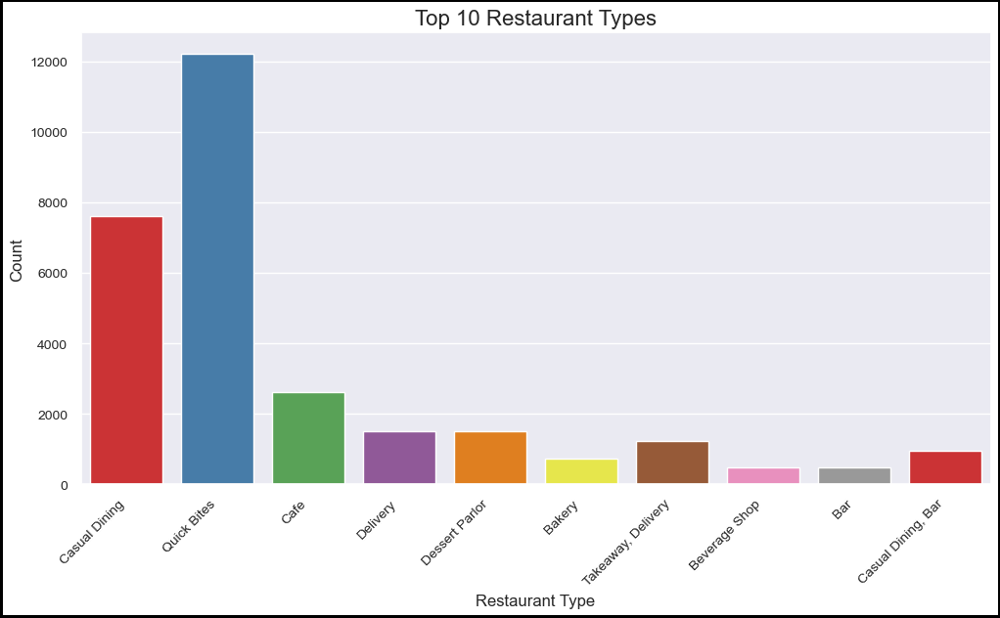

In [134]:
import seaborn as sns
import matplotlib.pyplot as plt

df = df.dropna(subset=['rest_type'])

# Select the top 10 'rest_type' values
top_10_rest_type = df['rest_type'].value_counts().nlargest(10).index

# Filter the DataFrame based on the top 10 'rest_type' values
df_top_10_rest_type = df[df['rest_type'].isin(top_10_rest_type)]

# Set up the figure
figure, ax = plt.subplots(figsize=(12, 6), linewidth=4, edgecolor='black')

# Create a countplot for 'rest_type' with different colors for each category
sns.countplot(data=df_top_10_rest_type, x='rest_type', palette='Set1')

# Customize the plot
ax.set_title('Top 10 Restaurant Types', fontsize=16)
ax.set_xlabel('Restaurant Type', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)

plt.show()


C:\Users\priya\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


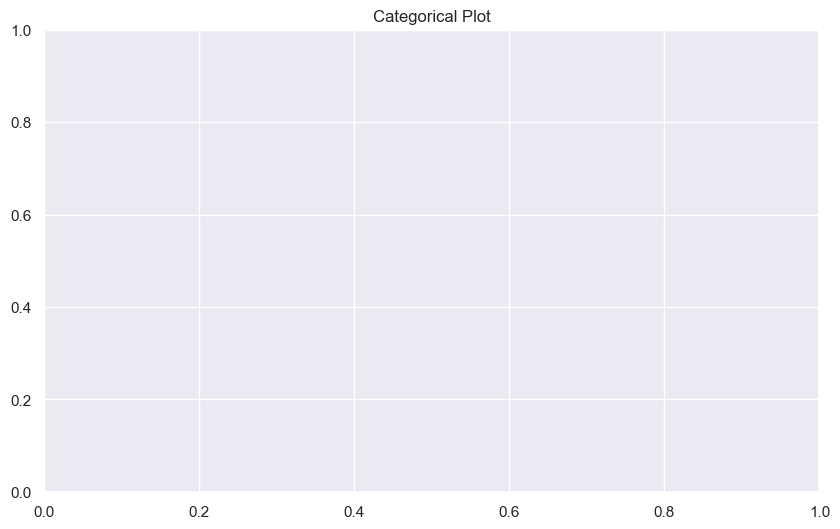

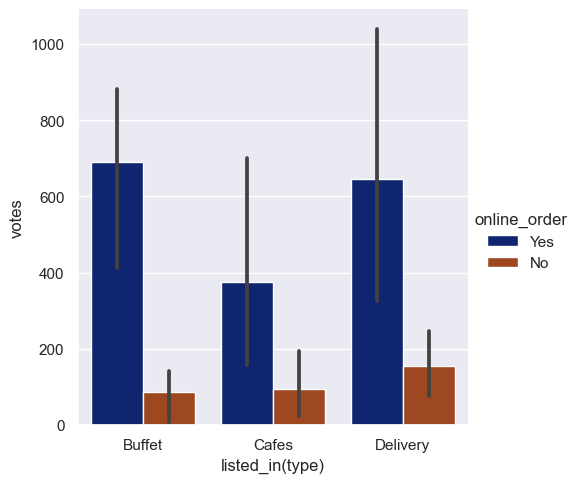

In [138]:
import seaborn as sns
import matplotlib.pyplot as plt
df_subset = df.head(100)

# Set up the figure
figure, axes = plt.subplots(figsize=(10, 6))
sns.catplot(data=df_subset, x='listed_in(type)', y='votes', kind='bar', hue='online_order', palette='dark')
axes.set_title('Categorical Plot')
plt.show()



C:\Users\priya\AppData\Local\Temp\ipykernel_25092\2679993784.py:10: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(data=df_subset, x='book_table', y='votes', palette='Set2')
C:\Users\priya\anaconda3\Lib\site-packages\seaborn\categorical.py:3544: UserWarning: 6.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


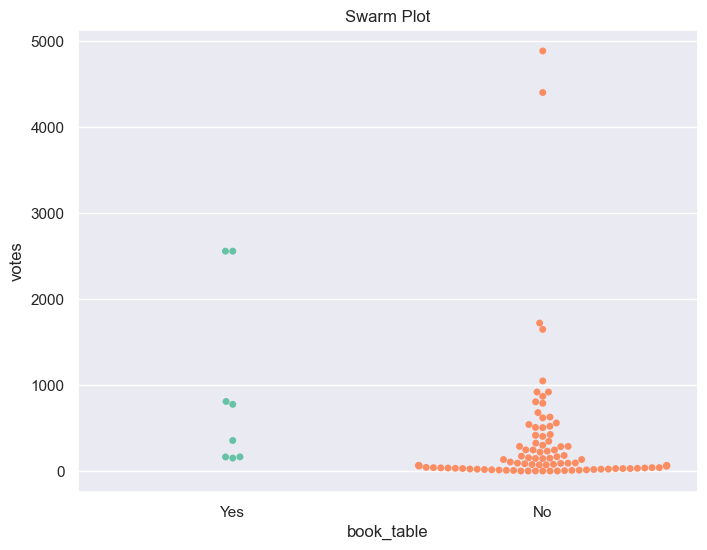

In [139]:
import seaborn as sns
import matplotlib.pyplot as plt

df_subset = df.head(100)

# Set up the figure
figure, axes = plt.subplots(figsize=(8, 6))
sns.swarmplot(data=df_subset, x='book_table', y='votes', palette='Set2')
axes.set_title('Swarm Plot')
plt.show()


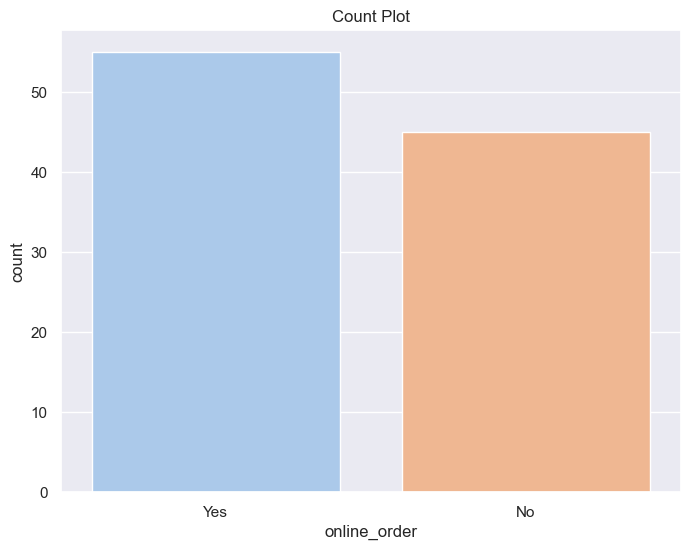

In [140]:
import seaborn as sns
import matplotlib.pyplot as plt

df_subset = df.head(100)

# Set up the figure
figure, axes = plt.subplots(figsize=(8, 6))
sns.countplot(data=df_subset, x='online_order', palette='pastel')
axes.set_title('Count Plot')
plt.show()


C:\Users\priya\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


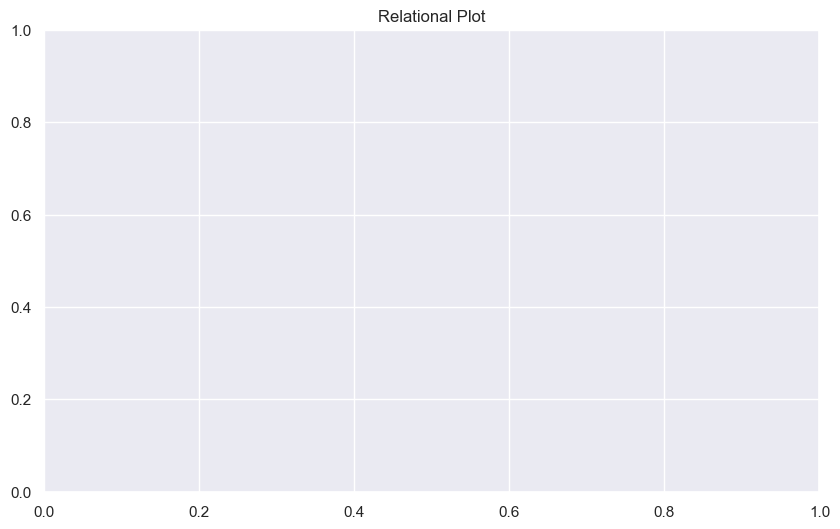

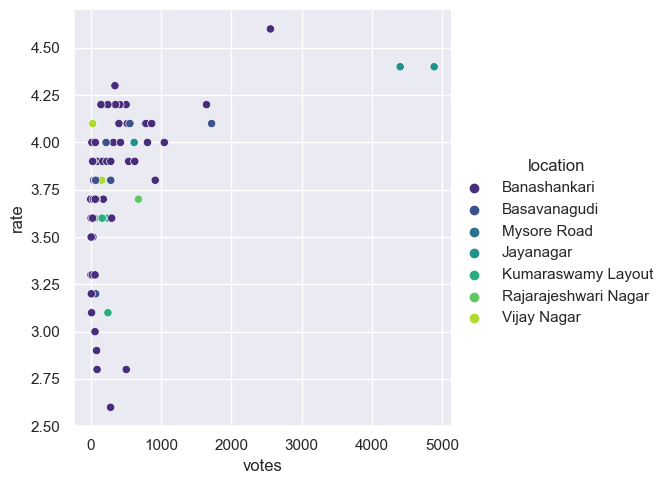

In [141]:
import seaborn as sns
import matplotlib.pyplot as plt

df_subset = df.head(100)

# Set up the figure
figure, axes = plt.subplots(figsize=(10, 6))
sns.relplot(data=df_subset, x='votes', y='rate', kind='scatter', hue='location', palette='viridis')
axes.set_title('Relational Plot')
plt.show()


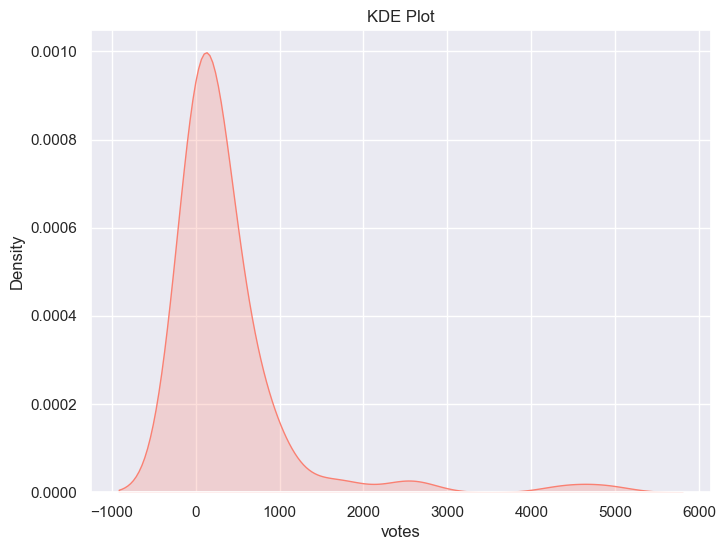

In [142]:
import seaborn as sns
import matplotlib.pyplot as plt

df_subset = df.head(100)

# Set up the figure
figure, axes = plt.subplots(figsize=(8, 6))
sns.kdeplot(data=df_subset, x='votes', fill=True, color='salmon')
axes.set_title('KDE Plot')
plt.show()


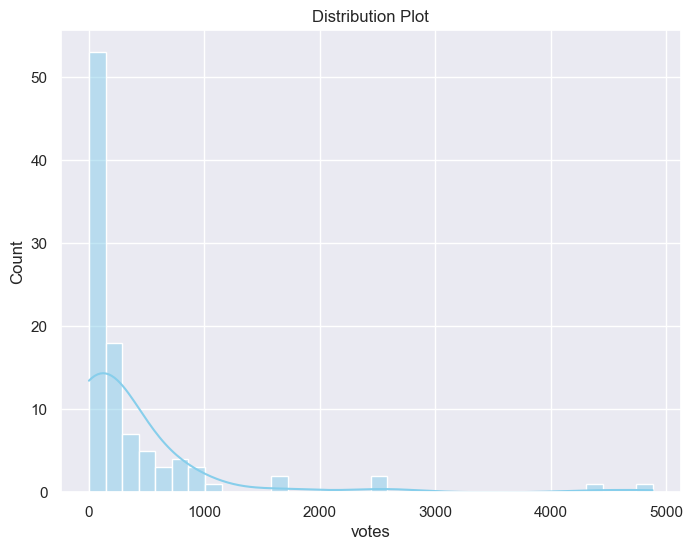

In [143]:
import seaborn as sns
import matplotlib.pyplot as plt

df_subset = df.head(100)

figure, axes = plt.subplots(figsize=(8, 6))
sns.histplot(data=df_subset, x='votes', kde=True, color='skyblue')
axes.set_title('Distribution Plot')
plt.show()


C:\Users\priya\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


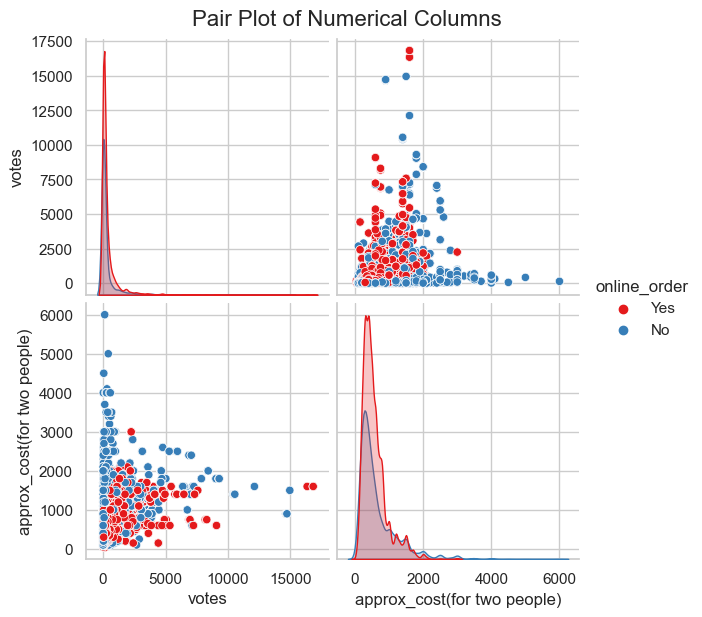

In [188]:
import seaborn as sns
import matplotlib.pyplot as plt
numerical_columns = ['votes', 'approx_cost(for two people)']  # Add other numerical columns as needed
df_pairplot = df.dropna(subset=numerical_columns)

# Set up the figure
sns.set_theme(style="whitegrid")
figure = sns.pairplot(df_pairplot, vars=numerical_columns, hue='online_order', palette='Set1', diag_kind='kde', height=3)

# Customize the plot
figure.fig.suptitle('Pair Plot of Numerical Columns', y=1.02, fontsize=16)
plt.show()



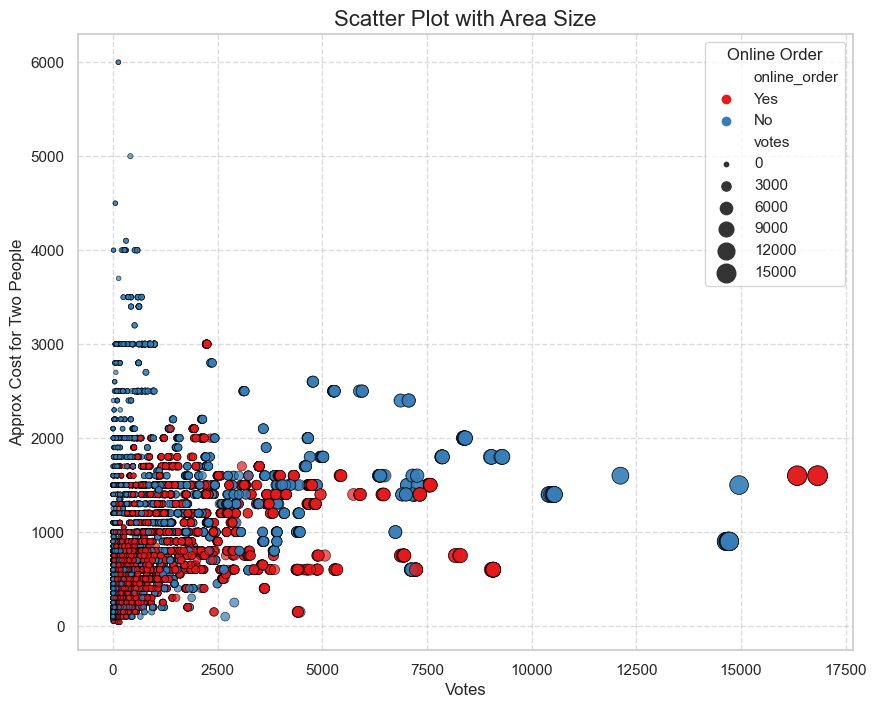

In [147]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame with the provided columns
# Drop rows with missing values in numerical columns
df_scatter = df.dropna(subset=['votes', 'approx_cost(for two people)'])  # Adjust columns as needed

# Set up the figure
plt.figure(figsize=(10, 8))

# Create a scatter plot with area size based on 'votes'
sns.scatterplot(data=df_scatter, x='votes', y='approx_cost(for two people)', size='votes', sizes=(10, 200), hue='online_order', palette='Set1', alpha=0.7, edgecolor='black', linewidth=0.5)

# Customize the plot
plt.title('Scatter Plot with Area Size', fontsize=16)
plt.xlabel('Votes', fontsize=12)
plt.ylabel('Approx Cost for Two People', fontsize=12)
plt.legend(title='Online Order', loc='upper right')
plt.grid(True, linestyle='--', alpha=0.7)

# Show the plot
plt.show()

